In [1]:
# نصب و وارد کردن کتابخانه‌های ضروری
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os
import time

# تایید دسترسی به GPU
print("TensorFlow version:", tf.__version__)
print("GPU Available:", tf.config.list_physical_devices('GPU'))

TensorFlow version: 2.20.0
GPU Available: []


🎨 مبدل تصاویر رنگی به دیتاست GAN
🔧 مبدل دیتاست راه‌اندازی شد!
📁 پوشه ورودی: food_images
📁 پوشه خروجی: my_gan_dataset
🔍 جستجو برای تصاویر در food_images...
✅ 362 تصویر رنگی یافت شد.
🔄 پردازش 362 تصویر...


پردازش تصاویر: 100%|██████████| 362/362 [00:04<00:00, 80.81it/s]



✅ پردازش کامل شد!
📊 شکل آرایه رنگ: (362, 256, 256, 3)
📊 شکل آرایه سیاه‌سفید: (362, 256, 256, 3)
💾 داده‌ها در my_gan_dataset\numpy_data/ ذخیره شدند
🎨 ایجاد 8 نمونه تصویری...


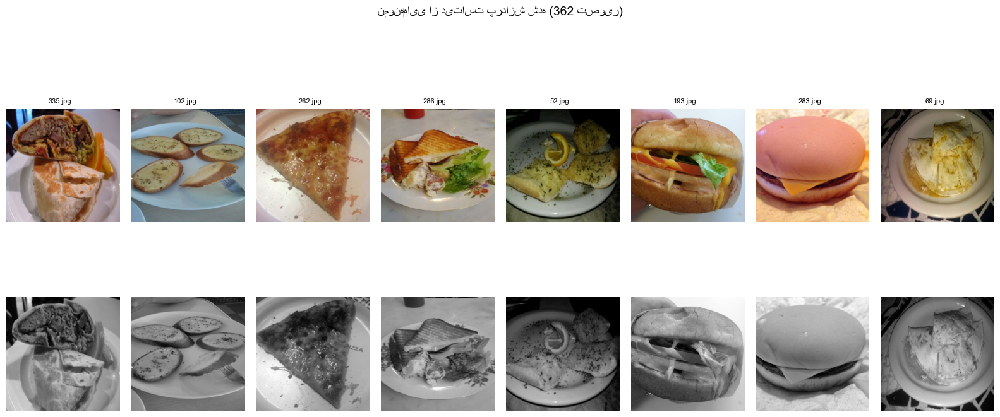

📦 tf.data.Dataset ایجاد شد:
   تعداد batchها: 12
   اندازه batch: 32

✅ دیتاست شما آماده است!
📁 همه فایل‌ها در my_gan_dataset ذخیره شدند

🎯 حالا می‌توانید مدل GAN خود را آموزش دهید:

        # نمونه کد برای آموزش
        gan = YourGANModel()
        gan.train(dataset, epochs=100)
        
        # یا از فایل‌های numpy استفاده کنید
        x_color = np.load('./my_gan_dataset/numpy_data/x_color.npy')
        x_gray = np.load('./my_gan_dataset/numpy_data/x_gray.npy')
        


In [16]:
import cv2
import numpy as np
import os
from pathlib import Path
import matplotlib.pyplot as plt

class DatasetPreparer:
    """کلاس برای آماده‌سازی دیتاست رنگی/سیاه‌سفید برای GAN"""
    
    def __init__(self, color_images_dir, output_dir="./dataset_prepared"):
        """
        پارامترها:
            color_images_dir: مسیر پوشه حاوی تصاویر رنگی شما
            output_dir: مسیر ذخیره دیتاست پردازش شده
        """
        self.color_dir = Path(color_images_dir)
        self.output_dir = Path(output_dir)
        
        # ساختار پوشه‌های خروجی
        self.dirs = {
            'color': self.output_dir / "color",
            'gray': self.output_dir / "gray",
            'numpy': self.output_dir / "numpy_data",
            'samples': self.output_dir / "samples"
        }
        
        # ایجاد پوشه‌ها
        for dir_path in self.dirs.values():
            dir_path.mkdir(parents=True, exist_ok=True)
        
        # لیست فرمت‌های تصویری معتبر
        self.valid_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.tif'}
        
        print(f"🔧 مبدل دیتاست راه‌اندازی شد!")
        print(f"📁 پوشه ورودی: {self.color_dir}")
        print(f"📁 پوشه خروجی: {self.output_dir}")
    
    def find_color_images(self):
        """پیدا کردن همه تصاویر رنگی در پوشه"""
        color_images = []
        
        print(f"🔍 جستجو برای تصاویر در {self.color_dir}...")
        
        # جستجوی بازگشتی در همه زیرپوشه‌ها
        for ext in self.valid_extensions:
            color_images.extend(self.color_dir.rglob(f"*{ext}"))
            color_images.extend(self.color_dir.rglob(f"*{ext.upper()}"))
        
        # حذف تکراری‌ها و مرتب‌سازی
        color_images = list(set(color_images))
        color_images.sort()
        
        print(f"✅ {len(color_images)} تصویر رنگی یافت شد.")
        return color_images
    
    def convert_to_grayscale(self, color_image_path, save_gray=True):
        """
        تبدیل یک تصویر رنگی به سیاه‌سفید
        """
        try:
            # خواندن تصویر رنگی
            color_img = cv2.imread(str(color_image_path))
            
            if color_img is None:
                print(f"⚠️ خطا در خواندن {color_image_path}")
                return None
            
            # تبدیل از BGR (OpenCV) به RGB
            color_img_rgb = cv2.cvtColor(color_img, cv2.COLOR_BGR2RGB)
            
            # تبدیل به سیاه‌سفید
            gray_img = cv2.cvtColor(color_img, cv2.COLOR_BGR2GRAY)
            gray_img_3channel = cv2.cvtColor(gray_img, cv2.COLOR_GRAY2RGB)
            
            # ذخیره تصاویر
            if save_gray:
                base_name = color_image_path.stem
                relative_path = color_image_path.relative_to(self.color_dir).parent
                
                # ذخیره تصویر رنگی
                color_output_dir = self.dirs['color'] / relative_path
                color_output_dir.mkdir(parents=True, exist_ok=True)
                cv2.imwrite(str(color_output_dir / f"{base_name}_color.jpg"), 
                           cv2.cvtColor(color_img_rgb, cv2.COLOR_RGB2BGR))
                
                # ذخیره تصویر سیاه‌سفید
                gray_output_dir = self.dirs['gray'] / relative_path
                gray_output_dir.mkdir(parents=True, exist_ok=True)
                cv2.imwrite(str(gray_output_dir / f"{base_name}_gray.jpg"), 
                           cv2.cvtColor(gray_img_3channel, cv2.COLOR_RGB2BGR))
            
            return color_img_rgb, gray_img_3channel
            
        except Exception as e:
            print(f"❌ خطا در پردازش {color_image_path}: {e}")
            return None
    
    def resize_images(self, color_img, gray_img, target_size=(256, 256)):
        """تغییر اندازه تصاویر به اندازه هدف"""
        color_resized = cv2.resize(color_img, target_size)
        gray_resized = cv2.resize(gray_img, target_size)
        return color_resized, gray_resized
    
    def normalize_images(self, color_img, gray_img):
        """نرمال‌سازی تصاویر به بازه [-1, 1] برای GAN"""
        color_norm = (color_img.astype(np.float32) / 127.5) - 1
        gray_norm = (gray_img.astype(np.float32) / 127.5) - 1
        return color_norm, gray_norm
    
    def prepare_all_images(self, target_size=(256, 256), max_images=None, show_progress=True):
        """
        پردازش همه تصاویر و ایجاد دیتاست نهایی
        """
        # پیدا کردن همه تصاویر
        color_images_paths = self.find_color_images()
        
        if max_images:
            color_images_paths = color_images_paths[:max_images]
        
        print(f"🔄 پردازش {len(color_images_paths)} تصویر...")
        
        # لیست‌های نگهداری تصاویر پردازش شده
        color_processed = []
        gray_processed = []
        valid_paths = []
        
        # نوار پیشرفت
        if show_progress:
            try:
                from tqdm import tqdm
                iterator = tqdm(color_images_paths, desc="پردازش تصاویر")
            except ImportError:
                iterator = color_images_paths
                print("📦 کتابخانه tqdm نصب نیست. برای نصب: pip install tqdm")
        else:
            iterator = color_images_paths
        
        # پردازش هر تصویر
        for img_path in iterator:
            result = self.convert_to_grayscale(img_path, save_gray=True)
            
            if result is not None:
                color_img, gray_img = result
                
                # تغییر اندازه
                color_resized, gray_resized = self.resize_images(color_img, gray_img, target_size)
                
                # نرمال‌سازی
                color_norm, gray_norm = self.normalize_images(color_resized, gray_resized)
                
                # اضافه کردن به لیست‌ها
                color_processed.append(color_norm)
                gray_processed.append(gray_norm)
                valid_paths.append(img_path)
        
        # تبدیل به numpy arrays
        if color_processed:
            color_array = np.array(color_processed)
            gray_array = np.array(gray_processed)
            
            print(f"\n✅ پردازش کامل شد!")
            print(f"📊 شکل آرایه رنگ: {color_array.shape}")
            print(f"📊 شکل آرایه سیاه‌سفید: {gray_array.shape}")
            
            # ذخیره به صورت فایل numpy
            self.save_as_numpy(color_array, gray_array)
            
            # ایجاد نمونه‌های تصویری
            self.create_sample_images(color_array, gray_array, valid_paths)
            
            return color_array, gray_array
        else:
            print("❌ هیچ تصویری پردازش نشد!")
            return None, None
    
    def save_as_numpy(self, color_array, gray_array):
        """ذخیره داده‌ها به صورت فایل‌های numpy"""
        np.save(self.dirs['numpy'] / "x_color.npy", color_array)
        np.save(self.dirs['numpy'] / "x_gray.npy", gray_array)
        print(f"💾 داده‌ها در {self.dirs['numpy']}/ ذخیره شدند")
    
    def create_sample_images(self, color_array, gray_array, paths, num_samples=8):
        """ایجاد نمونه‌های تصویری برای بررسی کیفیت"""
        print(f"🎨 ایجاد {num_samples} نمونه تصویری...")
        
        plt.figure(figsize=(16, 8))
        
        # انتخاب تصاویر نمونه به صورت تصادفی
        indices = np.random.choice(len(color_array), min(num_samples, len(color_array)), replace=False)
        
        for i, idx in enumerate(indices):
            # بازگردانی مقادیر نرمال‌شده به [0, 255]
            color_sample = ((color_array[idx] + 1) * 127.5).astype(np.uint8)
            gray_sample = ((gray_array[idx] + 1) * 127.5).astype(np.uint8)
            
            # نام فایل
            filename = Path(paths[idx]).name
            
            # نمایش تصویر رنگی
            plt.subplot(2, num_samples, i + 1)
            plt.imshow(color_sample)
            plt.title(f"{filename[:15]}...", fontsize=8)
            plt.axis('off')
            
            # نمایش تصویر سیاه‌سفید
            plt.subplot(2, num_samples, i + num_samples + 1)
            plt.imshow(gray_sample[:, :, 0], cmap='gray')
            plt.axis('off')
        
        plt.suptitle(f"نمونه‌هایی از دیتاست پردازش شده ({len(color_array)} تصویر)", fontsize=14)
        plt.tight_layout()
        plt.savefig(self.dirs['samples'] / "dataset_samples.png", dpi=150)
        plt.show()
    
    def create_tf_dataset(self, color_array, gray_array, batch_size=32, shuffle=True):
        """ایجاد tf.data.Dataset برای آموزش"""
        import tensorflow as tf
        
        dataset = tf.data.Dataset.from_tensor_slices((gray_array, color_array))
        
        if shuffle:
            dataset = dataset.shuffle(buffer_size=len(color_array))
        
        dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
        
        print(f"📦 tf.data.Dataset ایجاد شد:")
        print(f"   تعداد batchها: {len(list(dataset))}")
        print(f"   اندازه batch: {batch_size}")
        
        return dataset

# ████████████████████████████████████████████████████████████████████████████████████████████████████████
# ████████████████████████████████████████████████████ اجرای اصلی ███████████████████████████████████████
# ████████████████████████████████████████████████████████████████████████████████████████████████████████

if __name__ == "__main__":
    print("=" * 60)
    print("🎨 مبدل تصاویر رنگی به دیتاست GAN")
    print("=" * 60)
    
    # ★★★★★ این قسمت را تنظیم کنید ★★★★★
    # مسیر پوشه تصاویر رنگی خود را اینجا قرار دهید
    YOUR_COLOR_IMAGES_FOLDER = "food_images"  # ← این خط را تغییر دهید
    
    # ایجاد نمونه کلاس
    preparer = DatasetPreparer(
        color_images_dir=YOUR_COLOR_IMAGES_FOLDER,
        output_dir="./my_gan_dataset"
    )
    
    # پردازش همه تصاویر
    color_array, gray_array = preparer.prepare_all_images(
        target_size=(256, 256),
        max_images=None,
        show_progress=True
    )
    
    if color_array is not None:
        # ایجاد دیتاست TensorFlow
        dataset = preparer.create_tf_dataset(color_array, gray_array, batch_size=32)
        
        # ذخیره اطلاعات دیتاست
        info_file = preparer.output_dir / "dataset_info.txt"
        with open(info_file, 'w', encoding='utf-8') as f:
            f.write("دیتاست GAN برای رنگی‌سازی\n")
            f.write(f"تاریخ ایجاد: {np.datetime64('now')}\n")
            f.write("\n")
            f.write("📊 آمار:\n")
            f.write(f"تعداد تصاویر: {len(color_array)}\n")
            f.write(f"اندازه هر تصویر: {color_array.shape[1:]} (HxWxC)\n")
            f.write("\n")
            f.write("📁 ساختار پوشه:\n")
            f.write(f"{preparer.output_dir}/\n")
            f.write("  ├── color/       # تصاویر رنگی اصلی\n")
            f.write("  ├── gray/        # تصاویر سیاه‌سفید\n")
            f.write("  ├── numpy_data/  # فایل‌های .npy برای آموزش\n")
            f.write("  └── samples/     # تصاویر نمونه\n")
        
        print(f"\n" + "=" * 60)
        print("✅ دیتاست شما آماده است!")
        print(f"📁 همه فایل‌ها در {preparer.output_dir} ذخیره شدند")
        print("=" * 60)
        print("\n🎯 حالا می‌توانید مدل GAN خود را آموزش دهید:")
        print("""
        # نمونه کد برای آموزش
        gan = YourGANModel()
        gan.train(dataset, epochs=100)
        
        # یا از فایل‌های numpy استفاده کنید
        x_color = np.load('./my_gan_dataset/numpy_data/x_color.npy')
        x_gray = np.load('./my_gan_dataset/numpy_data/x_gray.npy')
        """)

🎬 Starting Image Colorization Project with GAN
📊 Initial data shape:
  x_color: (362, 256, 256, 3)
  x_gray: (362, 256, 256, 3)

⚠️ Grayscale images have 3 channels! Converting to 1 channel...
✅ Grayscale images fixed:
  New shape: (362, 256, 256, 1)

📊 Final data shape:
  Color images (target): (362, 256, 256, 3)
  Grayscale images (input): (362, 256, 256, 1)

🎨 Displaying fixed samples:


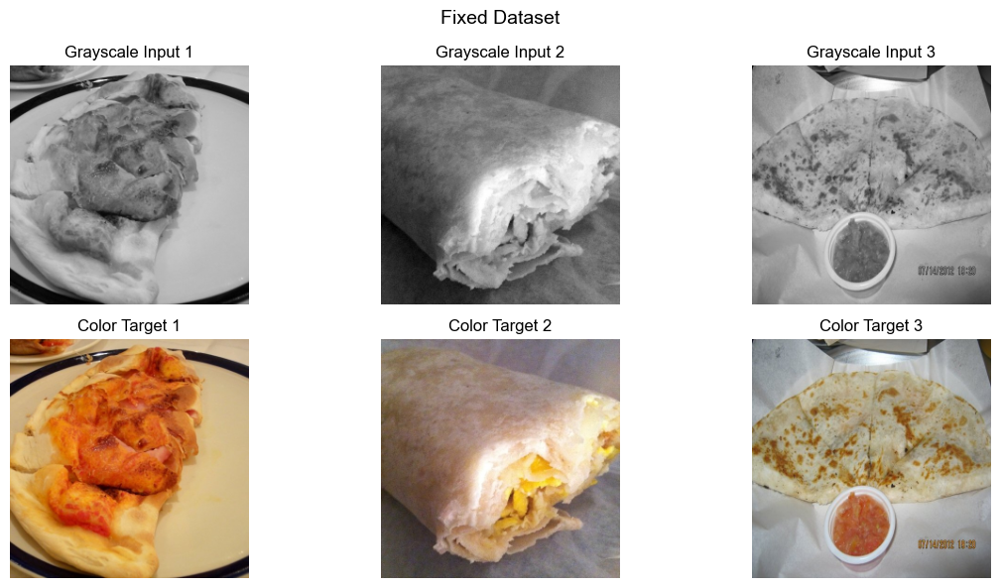


⚙️ Initial setup...
📐 Dataset specifications:
  Image height: 256
  Image width: 256
  Grayscale channels: 1
  Color channels: 3

🏗️ Building Generator with input (256, 256, 1)...
✅ Generator built!

🏗️ Building Discriminator...
✅ Discriminator built!

📊 Generator summary:
  Input: (None, 256, 256, 1)
  Output: (None, 256, 256, 3)

📊 Discriminator summary:
  Input 1 (grayscale): (None, 256, 256, 1)
  Input 2 (color): (None, 256, 256, 3)

⚡ Training with settings:
  Epochs: 10
  Batch Size: 4
  Image Size: 256x256

🚀 Starting GAN model training (simple version)
📈 Number of epochs: 10
📦 Batch size: 4
🖼️ Number of images: 362
📍 Epoch 1/10 | Time: 163.6s
   📉 D Loss: 14.7882 | 📈 G Loss: 29.8585
📍 Epoch 5/10 | Time: 94.7s
   📉 D Loss: 14.7115 | 📈 G Loss: 25.9517
📍 Epoch 10/10 | Time: 97.1s
   📉 D Loss: 15.6743 | 📈 G Loss: 23.0234


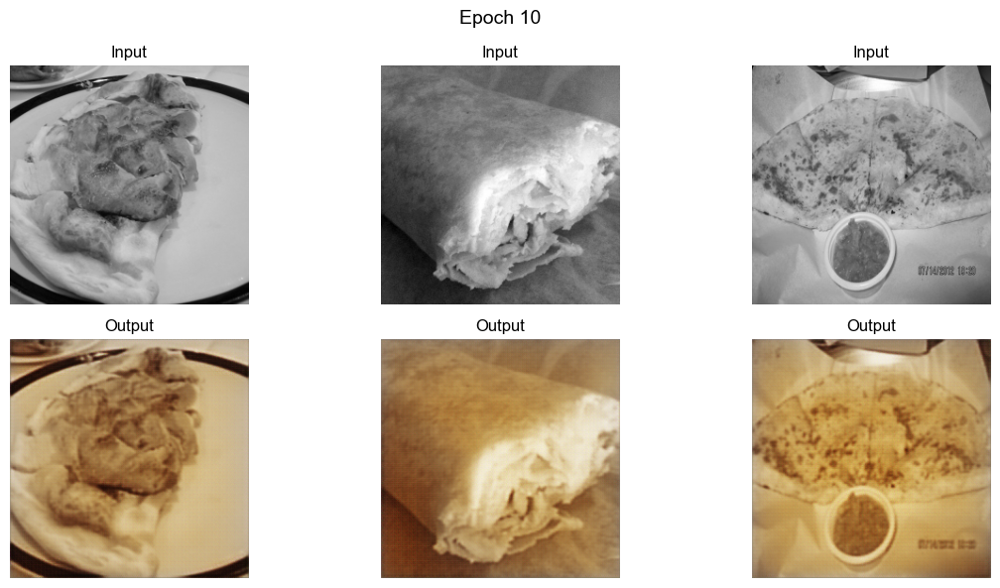


💾 Saving final model...


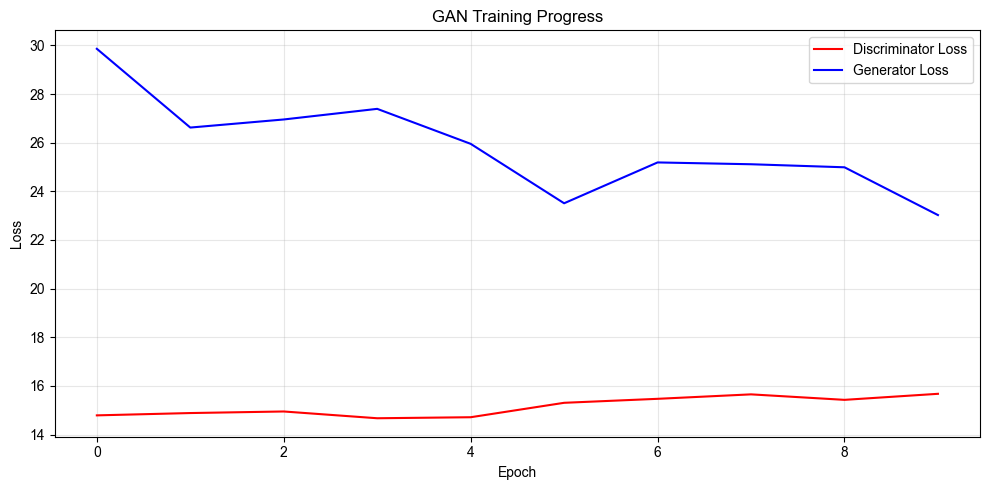

✅ Training completed!

📁 Created files:
   - colorization_generator_simple.h5 (main model)
   - training_progress_simple.png (progress chart)
   - sample_epoch_*.png (epoch samples)

🎉 Now you can use the model for colorizing new images!

🧪 Testing trained model on new samples...


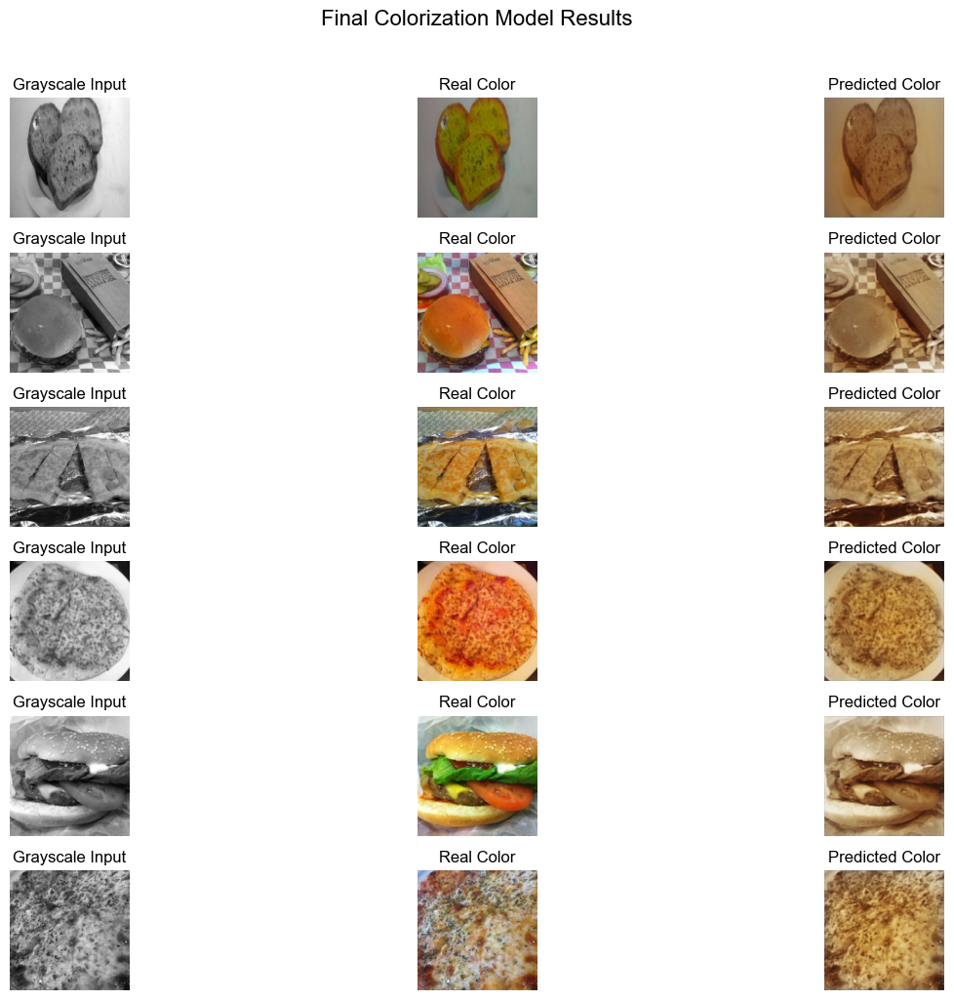

✅ Testing completed! Model is ready to use.


In [17]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import time

# تنظیم فونت انگلیسی استاندارد
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 10
plt.rcParams['axes.unicode_minus'] = False

print("=" * 70)
print("🎬 Starting Image Colorization Project with GAN")
print("=" * 70)

# ████████████████████████████████████████████████████████████████████████████████████████████████████████
# ████████████████████████████████████████████ 1. Load and Fix Dataset ██████████████████████████████████
# ████████████████████████████████████████████████████████████████████████████████████████████████████████

# Load dataset
x_color = np.load('./my_gan_dataset/numpy_data/x_color.npy')
x_gray = np.load('./my_gan_dataset/numpy_data/x_gray.npy')

print(f"📊 Initial data shape:")
print(f"  x_color: {x_color.shape}")  # Should be (n, h, w, 3)
print(f"  x_gray: {x_gray.shape}")    # Problem: probably (n, h, w, 3)

# Check and fix grayscale images
if x_gray.shape[-1] == 3:
    print("\n⚠️ Grayscale images have 3 channels! Converting to 1 channel...")
    
    # Method 1: Average channels (RGB to Grayscale)
    x_gray_fixed = np.mean(x_gray, axis=-1, keepdims=True)
    
    print(f"✅ Grayscale images fixed:")
    print(f"  New shape: {x_gray_fixed.shape}")
    
    # Replace with fixed data
    x_gray = x_gray_fixed
else:
    print("✅ Grayscale images already have 1 channel.")

# Final check
print(f"\n📊 Final data shape:")
print(f"  Color images (target): {x_color.shape}")
print(f"  Grayscale images (input): {x_gray.shape}")

# Display samples for verification
print("\n🎨 Displaying fixed samples:")
plt.figure(figsize=(12, 6))
for i in range(3):
    plt.subplot(2, 3, i + 1)
    plt.imshow((x_gray[i] + 1) / 2, cmap='gray')
    plt.title(f"Grayscale Input {i+1}")
    plt.axis('off')
    
    plt.subplot(2, 3, i + 4)
    plt.imshow((x_color[i] + 1) / 2)
    plt.title(f"Color Target {i+1}")
    plt.axis('off')
plt.suptitle("Fixed Dataset", fontsize=14)
plt.tight_layout()
plt.show()

# ████████████████████████████████████████████████████████████████████████████████████████████████████████
# █████████████████████████████████████████ 2. Build Generator (Modified) ████████████████████████████████
# ████████████████████████████████████████████████████████████████████████████████████████████████████████

def build_generator(input_shape=(256, 256, 1)):
    """Build U-Net generator for 1-channel input"""
    
    print(f"\n🏗️ Building Generator with input {input_shape}...")
    
    inputs = tf.keras.layers.Input(shape=input_shape)
    
    # ========== ENCODER ==========
    # Block 1: 256 → 128
    e1 = tf.keras.layers.Conv2D(64, 4, strides=2, padding='same')(inputs)
    e1 = tf.keras.layers.LeakyReLU(alpha=0.2)(e1)
    
    # Block 2: 128 → 64
    e2 = tf.keras.layers.Conv2D(128, 4, strides=2, padding='same')(e1)
    e2 = tf.keras.layers.BatchNormalization()(e2)
    e2 = tf.keras.layers.LeakyReLU(alpha=0.2)(e2)
    
    # Block 3: 64 → 32
    e3 = tf.keras.layers.Conv2D(256, 4, strides=2, padding='same')(e2)
    e3 = tf.keras.layers.BatchNormalization()(e3)
    e3 = tf.keras.layers.LeakyReLU(alpha=0.2)(e3)
    
    # ========== BOTTLENECK ==========
    # Block 4: 32 → 16
    e4 = tf.keras.layers.Conv2D(512, 4, strides=2, padding='same')(e3)
    e4 = tf.keras.layers.BatchNormalization()(e4)
    e4 = tf.keras.layers.LeakyReLU(alpha=0.2)(e4)
    
    # Block 5: 16 → 8
    e5 = tf.keras.layers.Conv2D(512, 4, strides=2, padding='same')(e4)
    e5 = tf.keras.layers.BatchNormalization()(e5)
    e5 = tf.keras.layers.LeakyReLU(alpha=0.2)(e5)
    
    # Block 6: 8 → 4
    bottleneck = tf.keras.layers.Conv2D(512, 4, strides=2, padding='same')(e5)
    bottleneck = tf.keras.layers.BatchNormalization()(bottleneck)
    bottleneck = tf.keras.layers.LeakyReLU(alpha=0.2)(bottleneck)
    
    # ========== DECODER ==========
    # Block 1: 4 → 8
    d1 = tf.keras.layers.Conv2DTranspose(512, 4, strides=2, padding='same')(bottleneck)
    d1 = tf.keras.layers.BatchNormalization()(d1)
    d1 = tf.keras.layers.Dropout(0.5)(d1)
    d1 = tf.keras.layers.Concatenate()([d1, e5])
    d1 = tf.keras.layers.ReLU()(d1)
    
    # Block 2: 8 → 16
    d2 = tf.keras.layers.Conv2DTranspose(512, 4, strides=2, padding='same')(d1)
    d2 = tf.keras.layers.BatchNormalization()(d2)
    d2 = tf.keras.layers.Dropout(0.5)(d2)
    d2 = tf.keras.layers.Concatenate()([d2, e4])
    d2 = tf.keras.layers.ReLU()(d2)
    
    # Block 3: 16 → 32
    d3 = tf.keras.layers.Conv2DTranspose(512, 4, strides=2, padding='same')(d2)
    d3 = tf.keras.layers.BatchNormalization()(d3)
    d3 = tf.keras.layers.Concatenate()([d3, e3])
    d3 = tf.keras.layers.ReLU()(d3)
    
    # Block 4: 32 → 64
    d4 = tf.keras.layers.Conv2DTranspose(256, 4, strides=2, padding='same')(d3)
    d4 = tf.keras.layers.BatchNormalization()(d4)
    d4 = tf.keras.layers.Concatenate()([d4, e2])
    d4 = tf.keras.layers.ReLU()(d4)
    
    # Block 5: 64 → 128
    d5 = tf.keras.layers.Conv2DTranspose(128, 4, strides=2, padding='same')(d4)
    d5 = tf.keras.layers.BatchNormalization()(d5)
    d5 = tf.keras.layers.Concatenate()([d5, e1])
    d5 = tf.keras.layers.ReLU()(d5)
    
    # ========== OUTPUT LAYER ==========
    # Output 3 channels (RGB)
    output = tf.keras.layers.Conv2DTranspose(3, 4, strides=2, padding='same', 
                                            activation='tanh', name='output')(d5)
    
    model = tf.keras.Model(inputs=inputs, outputs=output, name='Colorization_Generator')
    
    print("✅ Generator built!")
    return model

# ████████████████████████████████████████████████████████████████████████████████████████████████████████
# █████████████████████████████████████████ 3. Build Discriminator ███████████████████████████████████████
# ████████████████████████████████████████████████████████████████████████████████████████████████████████

def build_discriminator(input_shape_gray=(256, 256, 1), input_shape_color=(256, 256, 3)):
    """Build PatchGAN Discriminator"""
    
    print(f"\n🏗️ 
           Building Discriminator...")
    
    input_gray = tf.keras.layers.Input(shape=input_shape_gray, name='input_gray')
    input_color = tf.keras.layers.Input(shape=input_shape_color, name='input_color')
    
    combined = tf.keras.layers.Concatenate(axis=-1)([input_gray, input_color])
    
    # Simpler architecture for faster training
    x = tf.keras.layers.Conv2D(64, 4, strides=2, padding='same')(combined)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
    
    x = tf.keras.layers.Conv2D(128, 4, strides=2, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
    
    x = tf.keras.layers.Conv2D(256, 4, strides=2, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
    
    x = tf.keras.layers.Conv2D(512, 4, strides=2, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
    
    # PatchGAN output
    output = tf.keras.layers.Conv2D(1, 4, padding='same', name='output')(x)
    
    model = tf.keras.Model(inputs=[input_gray, input_color], outputs=output, name='PatchGAN_Discriminator')
    
    print("✅ Discriminator built!")
    return model

# ████████████████████████████████████████████████████████████████████████████████████████████████████████
# ███████████████████████████████████████████ 4. Initial Setup ███████████████████████████████████████████
# ████████████████████████████████████████████████████████████████████████████████████████████████████████

print("\n⚙️ Initial setup...")

# Check image dimensions
IMG_HEIGHT = x_gray.shape[1]
IMG_WIDTH = x_gray.shape[2]
GRAY_CHANNELS = x_gray.shape[3]  # Should be 1
COLOR_CHANNELS = x_color.shape[3]  # Should be 3

print(f"📐 Dataset specifications:")
print(f"  Image height: {IMG_HEIGHT}")
print(f"  Image width: {IMG_WIDTH}")
print(f"  Grayscale channels: {GRAY_CHANNELS}")
print(f"  Color channels: {COLOR_CHANNELS}")

# Build models with correct dimensions
generator = build_generator(input_shape=(IMG_HEIGHT, IMG_WIDTH, GRAY_CHANNELS))
discriminator = build_discriminator(
    input_shape_gray=(IMG_HEIGHT, IMG_WIDTH, GRAY_CHANNELS),
    input_shape_color=(IMG_HEIGHT, IMG_WIDTH, COLOR_CHANNELS)
)

# Display summary
print("\n📊 Generator summary:")
print(f"  Input: {generator.input_shape}")
print(f"  Output: {generator.output_shape}")

print("\n📊 Discriminator summary:")
print(f"  Input 1 (grayscale): {discriminator.input[0].shape}")
print(f"  Input 2 (color): {discriminator.input[1].shape}")

# ████████████████████████████████████████████████████████████████████████████████████████████████████████
# ███████████████████████████████████████████ 5. Loss Functions & Optimizers █████████████████████████████
# ████████████████████████████████████████████████████████████████████████████████████████████████████████

cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=False)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

def generator_loss(fake_output, generated_images, target_images):
    adversarial_loss = cross_entropy(tf.ones_like(fake_output), fake_output)
    l1_loss = tf.reduce_mean(tf.abs(target_images - generated_images))
    LAMBDA = 100
    total_loss = adversarial_loss + (LAMBDA * l1_loss)
    return total_loss, adversarial_loss, l1_loss

# Optimizers
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5)

# ████████████████████████████████████████████████████████████████████████████████████████████████████████
# ███████████████████████████████████████████ 6. Training Function (Simplified) █████████████████████████
# ████████████████████████████████████████████████████████████████████████████████████████████████████████

@tf.function
def train_step(gray_images, color_images):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # Generate color images
        generated_images = generator(gray_images, training=True)
        
        # Evaluate Discriminator
        real_output = discriminator([gray_images, color_images], training=True)
        fake_output = discriminator([gray_images, generated_images], training=True)
        
        # Calculate losses
        disc_loss = discriminator_loss(real_output, fake_output)
        gen_total_loss, gen_adv_loss, gen_l1_loss = generator_loss(
            fake_output, generated_images, color_images)
    
    # Calculate and apply gradients
    gen_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    disc_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    generator_optimizer.apply_gradients(zip(gen_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(disc_gradients, discriminator.trainable_variables))
    
    return disc_loss, gen_total_loss, gen_adv_loss, gen_l1_loss

def train_model_simple(gray_data, color_data, epochs=50, batch_size=8):
    """Simplified training function"""
    
    print(f"\n🚀 Starting GAN model training (simple version)")
    print(f"📈 Number of epochs: {epochs}")
    print(f"📦 Batch size: {batch_size}")
    print(f"🖼️ Number of images: {len(gray_data)}")
    print("=" * 70)
    
    # Create Dataset
    dataset = tf.data.Dataset.from_tensor_slices((gray_data, color_data))
    dataset = dataset.shuffle(buffer_size=len(gray_data))
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    
    # History
    history = {
        'disc_loss': [],
        'gen_loss': [],
        'gen_adv_loss': [],
        'gen_l1_loss': []
    }
    
    # Training
    for epoch in range(epochs):
        start_time = time.time()
        
        epoch_disc_loss = 0
        epoch_gen_loss = 0
        num_batches = 0
        
        for gray_batch, color_batch in dataset:
            disc_loss, gen_loss, _, _ = train_step(gray_batch, color_batch)
            epoch_disc_loss += disc_loss
            epoch_gen_loss += gen_loss
            num_batches += 1
        
        # Average losses
        avg_disc_loss = epoch_disc_loss / num_batches
        avg_gen_loss = epoch_gen_loss / num_batches
        
        history['disc_loss'].append(float(avg_disc_loss))
        history['gen_loss'].append(float(avg_gen_loss))
        
        # Display progress
        if (epoch + 1) % 5 == 0 or epoch == 0:
            elapsed_time = time.time() - start_time
            print(f"📍 Epoch {epoch + 1}/{epochs} | Time: {elapsed_time:.1f}s")
            print(f"   📉 D Loss: {avg_disc_loss:.4f} | 📈 G Loss: {avg_gen_loss:.4f}")
            
            # Display sample
            if (epoch + 1) % 10 == 0:
                test_samples = gray_data[:3]
                predictions = generator.predict(test_samples, verbose=0)
                
                plt.figure(figsize=(12, 6))
                for i in range(3):
                    plt.subplot(2, 3, i + 1)
                    plt.imshow((test_samples[i] + 1) / 2, cmap='gray')
                    plt.title("Input")
                    plt.axis('off')
                    
                    plt.subplot(2, 3, i + 4)
                    plt.imshow((predictions[i] + 1) / 2)
                    plt.title("Output")
                    plt.axis('off')
                
                plt.suptitle(f'Epoch {epoch + 1}', fontsize=14)
                plt.tight_layout()
                plt.savefig(f'sample_epoch_{epoch+1}.png')
                plt.show()
    
    return history

# ████████████████████████████████████████████████████████████████████████████████████████████████████████
# ███████████████████████████████████████████ 7. Run Training ████████████████████████████████████████████
# ████████████████████████████████████████████████████████████████████████████████████████████████████████

# Training parameters
EPOCHS = 10  # Start with a small number
BATCH_SIZE = 4  # Use 4 or 2 if memory is limited

print("\n" + "=" * 70)
print("⚡ Training with settings:")
print(f"  Epochs: {EPOCHS}")
print(f"  Batch Size: {BATCH_SIZE}")
print(f"  Image Size: {IMG_HEIGHT}x{IMG_WIDTH}")
print("=" * 70)

# Start training
history = train_model_simple(
    gray_data=x_gray,
    color_data=x_color,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE
)

# ████████████████████████████████████████████████████████████████████████████████████████████████████████
# ███████████████████████████████████████████ 8. Save Model & Results ████████████████████████████████████
# ████████████████████████████████████████████████████████████████████████████████████████████████████████

print("\n💾 Saving final model...")

# Save model
generator.save('colorization_generator_simple.h5')

# Plot progress
plt.figure(figsize=(10, 5))
plt.plot(history['disc_loss'], label='Discriminator Loss', color='red')
plt.plot(history['gen_loss'], label='Generator Loss', color='blue')
plt.title('GAN Training Progress')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True, alpha=0.3)
plt.savefig('training_progress_simple.png', dpi=150)
plt.show()

print("✅ Training completed!")
print("\n📁 Created files:")
print("   - colorization_generator_simple.h5 (main model)")
print("   - training_progress_simple.png (progress chart)")
print("   - sample_epoch_*.png (epoch samples)")

print("\n" + "=" * 70)
print("🎉 Now you can use the model for colorizing new images!")
print("=" * 70)

# ████████████████████████████████████████████████████████████████████████████████████████████████████████
# ███████████████████████████████████████████ 9. Test Final Model ████████████████████████████████████████
# ████████████████████████████████████████████████████████████████████████████████████████████████████████

print("\n🧪 Testing trained model on new samples...")

# Select 6 random samples
indices = np.random.choice(len(x_gray), 6, replace=False)
test_gray = x_gray[indices]
test_color = x_color[indices]

# Predict
predictions = generator.predict(test_gray, verbose=0)

# Display results
plt.figure(figsize=(15, 10))
for i in range(6):
    plt.subplot(6, 3, i*3 + 1)
    plt.imshow((test_gray[i] + 1) / 2, cmap='gray')
    plt.title("Grayscale Input")
    plt.axis('off')
    
    plt.subplot(6, 3, i*3 + 2)
    plt.imshow((test_color[i] + 1) / 2)
    plt.title("Real Color")
    plt.axis('off')
    
    plt.subplot(6, 3, i*3 + 3)
    plt.imshow((predictions[i] + 1) / 2)
    plt.title("Predicted Color")
    plt.axis('off')

plt.suptitle('Final Colorization Model Results', fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig('final_test_results.png', dpi=150)
plt.show()

print("✅ Testing completed! Model is ready to use.")

🎨 Starting Enhanced Image Colorization Project with GAN
ℹ️ No GPU detected, using CPU

🎨 ENHANCED IMAGE COLORIZATION WITH GAN

📂 STEP 1: Loading Dataset
📂 Loading dataset...
✅ Dataset loaded successfully!
📊 Initial data shape:
  x_color: (362, 256, 256, 3)
  x_gray: (362, 256, 256, 3)

⚠️ Grayscale images have 3 channels! Converting to 1 channel...
✅ Grayscale images fixed:
  New shape: (362, 256, 256, 1)

📊 Final data shape:
  Color images (target): (362, 256, 256, 3)
  Grayscale images (input): (362, 256, 256, 1)
  Data range: [-1.00, 1.00]

🎨 Displaying dataset samples...


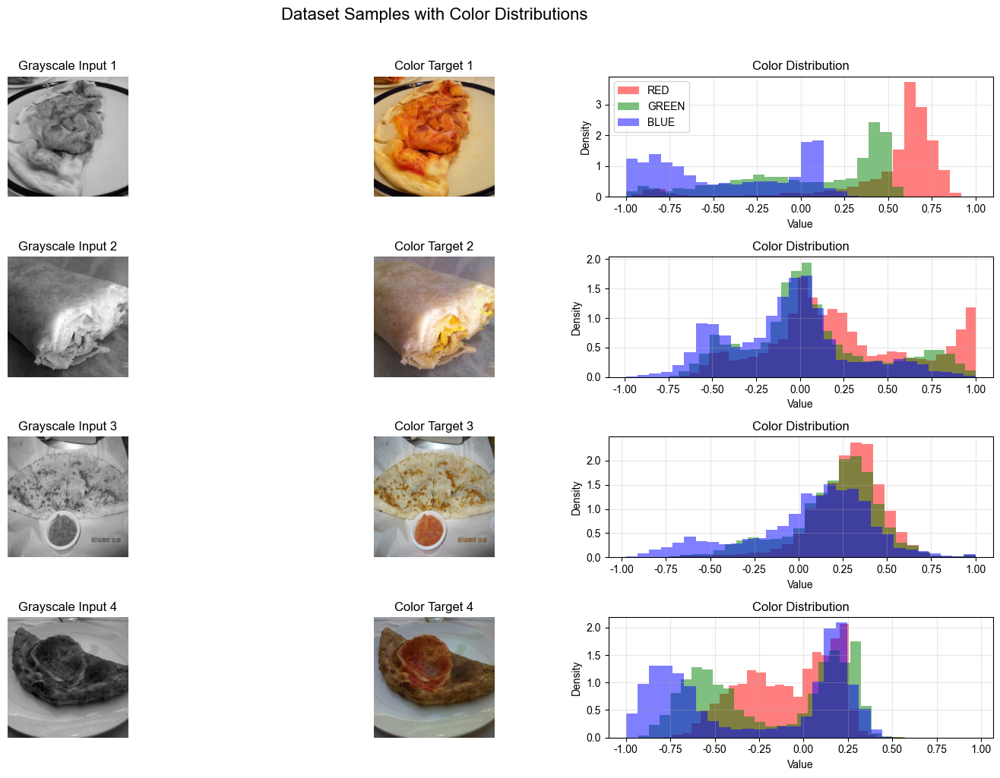


🔧 STEP 2: Auto-configuration
✅ Large dataset detected: 362 images

⚙️ Training Parameters (Auto-configured):
  Epochs: 20
  Batch Size: 8

🏗️ STEP 3: Building Models

🏗️ Building Enhanced Generator with input (256, 256, 1)...
✅ Enhanced Generator built!

🏗️ Building Discriminator...
✅ Discriminator built!

📊 Model Summaries:

Generator:
  Input: (None, 256, 256, 1)
  Output: (None, 256, 256, 3)
  Parameters: 29,319,123

Discriminator:
  Input 1 (grayscale): (None, 256, 256, 1)
  Input 2 (color): (None, 256, 256, 3)
  Parameters: 2,769,345

🚀 STEP 4: Training GAN

⚙️ Starting training with:
  Image Size: 256x256
  Dataset Size: 362

🚀 Starting GAN Training
📈 Epochs: 20
📦 Batch Size: 8
🖼️ Dataset Size: 362

📍 Epoch 1/20 | Time: 94.9s
   📉 D Loss: 1.2404
   📈 G Total Loss: 39.7108
      └─ Adv Loss: 1.0104
      └─ L1 Loss: 0.3408
      └─ Color Loss: 0.2311

📍 Epoch 2/20 | Time: 80.1s
   📉 D Loss: 0.8727
   📈 G Total Loss: 30.4861
      └─ Adv Loss: 1.3241
      └─ L1 Loss: 0.2478
     

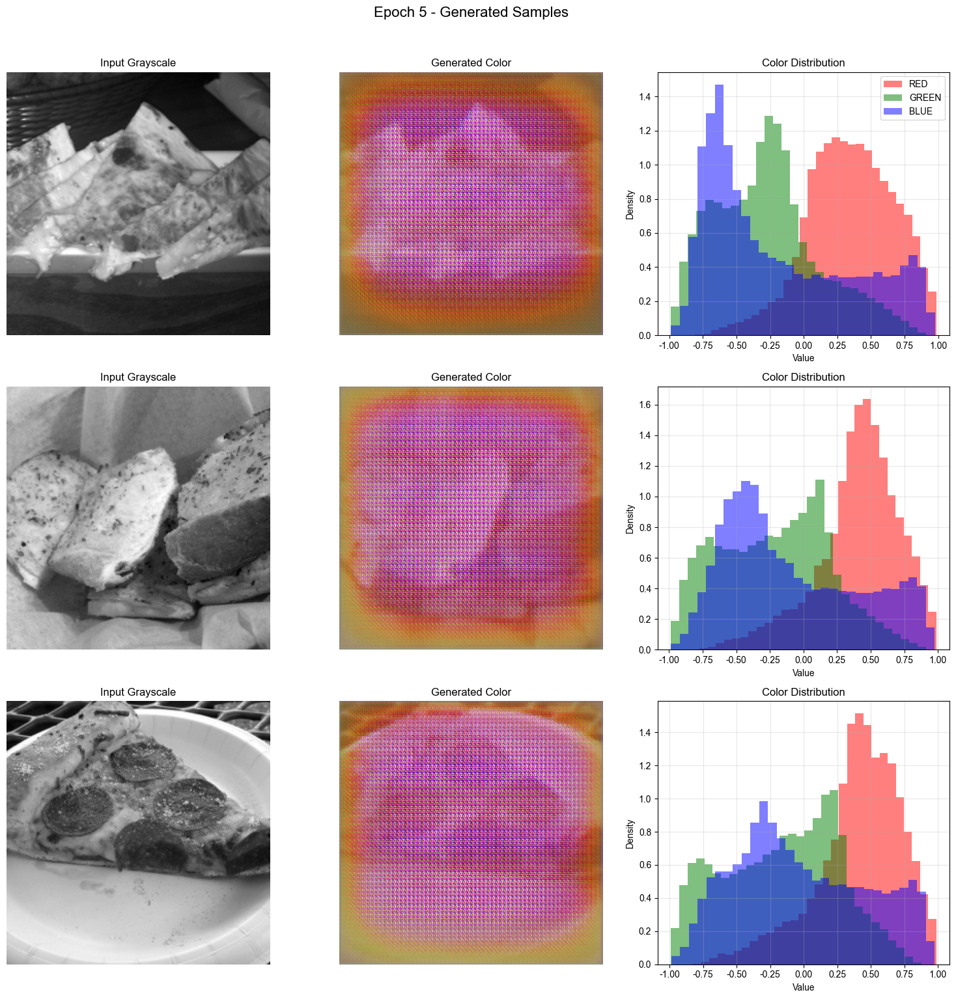

💾 Checkpoint saved at epoch 5

📍 Epoch 6/20 | Time: 180.6s
   📉 D Loss: 0.6117
   📈 G Total Loss: 29.5380
      └─ Adv Loss: 2.1831
      └─ L1 Loss: 0.2287
      └─ Color Loss: 0.2243

📍 Epoch 7/20 | Time: 212.5s
   📉 D Loss: 0.6222
   📈 G Total Loss: 29.0204
      └─ Adv Loss: 2.0839
      └─ L1 Loss: 0.2251
      └─ Color Loss: 0.2215


⚠️ Training interrupted by user


In [5]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import time
import cv2

# تنظیمات اولیه
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 10
plt.rcParams['axes.unicode_minus'] = False

print("=" * 70)
print("🎨 Starting Enhanced Image Colorization Project with GAN")
print("=" * 70)

# ████████████████████████████████████████████████████████████████████████████████████████████████████████
# ████████████████████████████████████████████ 1. Load and Fix Dataset ██████████████████████████████████
# ████████████████████████████████████████████████████████████████████████████████████████████████████████

def load_and_preprocess_dataset():
    """بارگذاری و پیش‌پردازش دیتاست"""
    
    print("📂 Loading dataset...")
    
    try:
        # Load dataset
        x_color = np.load('./my_gan_dataset/numpy_data/x_color.npy')
        x_gray = np.load('./my_gan_dataset/numpy_data/x_gray.npy')
        
        print(f"✅ Dataset loaded successfully!")
    except FileNotFoundError as e:
        print(f"❌ Error loading dataset: {e}")
        print("Please make sure the dataset files exist in './my_gan_dataset/numpy_data/'")
        print("Files needed: x_color.npy and x_gray.npy")
        return None, None
    
    print(f"📊 Initial data shape:")
    print(f"  x_color: {x_color.shape}")
    print(f"  x_gray: {x_gray.shape}")
    
    # Convert to float32
    x_color = x_color.astype(np.float32)
    x_gray = x_gray.astype(np.float32)
    
    # Normalize to [-1, 1] if not already
    if x_color.max() > 1.0:
        x_color = (x_color / 127.5) - 1.0
        print("✅ Normalized color images to [-1, 1]")
    
    if x_gray.max() > 1.0:
        x_gray = (x_gray / 127.5) - 1.0
        print("✅ Normalized grayscale images to [-1, 1]")
    
    # Check and fix grayscale images
    if x_gray.shape[-1] == 3:
        print("\n⚠️ Grayscale images have 3 channels! Converting to 1 channel...")
        
        # Convert to proper grayscale using weighted average
        x_gray_fixed = np.dot(x_gray[..., :3], [0.2989, 0.5870, 0.1140])
        x_gray_fixed = np.expand_dims(x_gray_fixed, axis=-1)
        
        print(f"✅ Grayscale images fixed:")
        print(f"  New shape: {x_gray_fixed.shape}")
        
        # Replace with fixed data
        x_gray = x_gray_fixed
    elif x_gray.shape[-1] == 1:
        print("✅ Grayscale images already have 1 channel.")
    else:
        print(f"⚠️ Unexpected number of channels: {x_gray.shape[-1]}")
        x_gray = x_gray[..., :1]
        print(f"  Using only first channel. New shape: {x_gray.shape}")
    
    print(f"\n📊 Final data shape:")
    print(f"  Color images (target): {x_color.shape}")
    print(f"  Grayscale images (input): {x_gray.shape}")
    print(f"  Data range: [{x_gray.min():.2f}, {x_gray.max():.2f}]")
    
    # Verify dataset
    if len(x_gray) != len(x_color):
        print(f"⚠️ Warning: Number of grayscale images ({len(x_gray)}) doesn't match color images ({len(x_color)})")
        min_len = min(len(x_gray), len(x_color))
        x_gray = x_gray[:min_len]
        x_color = x_color[:min_len]
        print(f"  Using first {min_len} images from each.")
    
    return x_gray, x_color

# ████████████████████████████████████████████████████████████████████████████████████████████████████████
# ████████████████████████████████████████████ 2. Data Augmentation ██████████████████████████████████████
# ████████████████████████████████████████████████████████████████████████████████████████████████████████

class ColorAugmentation:
    """کلاس برای افزایش تنوع رنگ‌ها"""
    
    @staticmethod
    def random_hue_saturation(images, hue_range=0.3, saturation_range=0.4):
        """تغییر تصادفی Hue و Saturation برای افزایش تنوع رنگ"""
        batch_size = tf.shape(images)[0]
        
        # تبدیل RGB به HSV
        images = tf.clip_by_value(images, -1, 1)
        images_rgb = (images + 1) / 2  # به محدوده [0, 1]
        
        hsv_images = tf.image.rgb_to_hsv(images_rgb)
        
        # تغییر Hue
        hue_delta = tf.random.uniform([batch_size, 1, 1, 1], 
                                     -hue_range, hue_range)
        h = tf.math.mod(hsv_images[..., 0:1] + hue_delta, 1.0)
        
        # تغییر Saturation
        saturation_factor = tf.random.uniform([batch_size, 1, 1, 1],
                                            1 - saturation_range, 
                                            1 + saturation_range)
        s = tf.clip_by_value(hsv_images[..., 1:2] * saturation_factor, 0.0, 1.0)
        
        # حفظ Value
        v = hsv_images[..., 2:3]
        
        # ترکیب مجدد و تبدیل به RGB
        hsv_augmented = tf.concat([h, s, v], axis=-1)
        rgb_augmented = tf.image.hsv_to_rgb(hsv_augmented)
        
        # بازگشت به محدوده [-1, 1]
        return rgb_augmented * 2 - 1
    
    @staticmethod
    def augment_batch(color_images):
        """اعمال augmentation روی یک batch"""
        # اعمال augmentation با احتمال 70%
        should_augment = tf.random.uniform([], 0, 1) < 0.7
        
        def apply_augmentation():
            return ColorAugmentation.random_hue_saturation(color_images)
        
        def no_augmentation():
            return color_images
        
        augmented = tf.cond(should_augment, apply_augmentation, no_augmentation)
        return tf.clip_by_value(augmented, -1, 1)

# ████████████████████████████████████████████████████████████████████████████████████████████████████████
# █████████████████████████████████████████ 3. Build Enhanced Generator ██████████████████████████████████
# ████████████████████████████████████████████████████████████████████████████████████████████████████████

def build_enhanced_generator(input_shape=(256, 256, 1)):
    """ساخت Generator بهبود یافته"""
    
    print(f"\n🏗️ Building Enhanced Generator with input {input_shape}...")
    
    inputs = tf.keras.layers.Input(shape=input_shape, dtype=tf.float32)
    
    # ========== ENCODER ==========
    # Block 1: 256 → 128
    e1 = tf.keras.layers.Conv2D(64, 4, strides=2, padding='same', dtype=tf.float32)(inputs)
    e1 = tf.keras.layers.LeakyReLU(alpha=0.2)(e1)
    e1 = tf.keras.layers.BatchNormalization(dtype=tf.float32)(e1)
    
    # Block 2: 128 → 64
    e2 = tf.keras.layers.Conv2D(128, 4, strides=2, padding='same', dtype=tf.float32)(e1)
    e2 = tf.keras.layers.LeakyReLU(alpha=0.2)(e2)
    e2 = tf.keras.layers.BatchNormalization(dtype=tf.float32)(e2)
    
    # Block 3: 64 → 32
    e3 = tf.keras.layers.Conv2D(256, 4, strides=2, padding='same', dtype=tf.float32)(e2)
    e3 = tf.keras.layers.LeakyReLU(alpha=0.2)(e3)
    e3 = tf.keras.layers.BatchNormalization(dtype=tf.float32)(e3)
    
    # Block 4: 32 → 16
    e4 = tf.keras.layers.Conv2D(512, 4, strides=2, padding='same', dtype=tf.float32)(e3)
    e4 = tf.keras.layers.LeakyReLU(alpha=0.2)(e4)
    e4 = tf.keras.layers.BatchNormalization(dtype=tf.float32)(e4)
    
    # Block 5: 16 → 8
    e5 = tf.keras.layers.Conv2D(512, 4, strides=2, padding='same', dtype=tf.float32)(e4)
    e5 = tf.keras.layers.LeakyReLU(alpha=0.2)(e5)
    e5 = tf.keras.layers.BatchNormalization(dtype=tf.float32)(e5)
    
    # Block 6: 8 → 4 (Bottleneck)
    bottleneck = tf.keras.layers.Conv2D(512, 4, strides=2, padding='same', dtype=tf.float32)(e5)
    bottleneck = tf.keras.layers.LeakyReLU(alpha=0.2)(bottleneck)
    bottleneck = tf.keras.layers.BatchNormalization(dtype=tf.float32)(bottleneck)
    
    # ========== DECODER ==========
    # Block 1: 4 → 8
    d1 = tf.keras.layers.Conv2DTranspose(512, 4, strides=2, padding='same', dtype=tf.float32)(bottleneck)
    d1 = tf.keras.layers.ReLU()(d1)
    d1 = tf.keras.layers.BatchNormalization(dtype=tf.float32)(d1)
    d1 = tf.keras.layers.Dropout(0.5)(d1)
    d1 = tf.keras.layers.Concatenate()([d1, e5])
    
    # Block 2: 8 → 16
    d2 = tf.keras.layers.Conv2DTranspose(512, 4, strides=2, padding='same', dtype=tf.float32)(d1)
    d2 = tf.keras.layers.ReLU()(d2)
    d2 = tf.keras.layers.BatchNormalization(dtype=tf.float32)(d2)
    d2 = tf.keras.layers.Dropout(0.5)(d2)
    d2 = tf.keras.layers.Concatenate()([d2, e4])
    
    # Block 3: 16 → 32
    d3 = tf.keras.layers.Conv2DTranspose(256, 4, strides=2, padding='same', dtype=tf.float32)(d2)
    d3 = tf.keras.layers.ReLU()(d3)
    d3 = tf.keras.layers.BatchNormalization(dtype=tf.float32)(d3)
    d3 = tf.keras.layers.Concatenate()([d3, e3])
    
    # Block 4: 32 → 64
    d4 = tf.keras.layers.Conv2DTranspose(128, 4, strides=2, padding='same', dtype=tf.float32)(d3)
    d4 = tf.keras.layers.ReLU()(d4)
    d4 = tf.keras.layers.BatchNormalization(dtype=tf.float32)(d4)
    d4 = tf.keras.layers.Concatenate()([d4, e2])
    
    # Block 5: 64 → 128
    d5 = tf.keras.layers.Conv2DTranspose(64, 4, strides=2, padding='same', dtype=tf.float32)(d4)
    d5 = tf.keras.layers.ReLU()(d5)
    d5 = tf.keras.layers.BatchNormalization(dtype=tf.float32)(d5)
    d5 = tf.keras.layers.Concatenate()([d5, e1])
    
    # Block 6: 128 → 256
    d6 = tf.keras.layers.Conv2DTranspose(32, 4, strides=2, padding='same', dtype=tf.float32)(d5)
    d6 = tf.keras.layers.ReLU()(d6)
    d6 = tf.keras.layers.BatchNormalization(dtype=tf.float32)(d6)
    
    # ========== OUTPUT LAYER ==========
    output = tf.keras.layers.Conv2D(16, 3, padding='same', dtype=tf.float32)(d6)
    output = tf.keras.layers.ReLU()(output)
    output = tf.keras.layers.BatchNormalization(dtype=tf.float32)(output)
    
    output = tf.keras.layers.Conv2D(8, 3, padding='same', dtype=tf.float32)(output)
    output = tf.keras.layers.ReLU()(output)
    
    output = tf.keras.layers.Conv2D(3, 3, padding='same', activation='tanh', dtype=tf.float32)(output)
    
    model = tf.keras.Model(inputs=inputs, outputs=output, name='Enhanced_Colorization_Generator')
    
    print("✅ Enhanced Generator built!")
    return model

# ████████████████████████████████████████████████████████████████████████████████████████████████████████
# █████████████████████████████████████████ 4. Build Discriminator ███████████████████████████████████████
# ████████████████████████████████████████████████████████████████████████████████████████████████████████

def build_discriminator(input_shape_gray=(256, 256, 1), input_shape_color=(256, 256, 3)):
    """Build PatchGAN Discriminator"""
    
    print(f"\n🏗️ Building Discriminator...")
    
    input_gray = tf.keras.layers.Input(shape=input_shape_gray, dtype=tf.float32, name='input_gray')
    input_color = tf.keras.layers.Input(shape=input_shape_color, dtype=tf.float32, name='input_color')
    
    combined = tf.keras.layers.Concatenate(axis=-1)([input_gray, input_color])
    
    # Architecture
    x = tf.keras.layers.Conv2D(64, 4, strides=2, padding='same', dtype=tf.float32)(combined)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
    
    x = tf.keras.layers.Conv2D(128, 4, strides=2, padding='same', dtype=tf.float32)(x)
    x = tf.keras.layers.BatchNormalization(dtype=tf.float32)(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
    
    x = tf.keras.layers.Conv2D(256, 4, strides=2, padding='same', dtype=tf.float32)(x)
    x = tf.keras.layers.BatchNormalization(dtype=tf.float32)(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
    
    x = tf.keras.layers.Conv2D(512, 4, strides=1, padding='same', dtype=tf.float32)(x)
    x = tf.keras.layers.BatchNormalization(dtype=tf.float32)(x)
    x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
    
    # PatchGAN output
    output = tf.keras.layers.Conv2D(1, 4, padding='same', name='output', dtype=tf.float32)(x)
    
    model = tf.keras.Model(inputs=[input_gray, input_color], outputs=output, name='PatchGAN_Discriminator')
    
    print("✅ Discriminator built!")
    return model

# ████████████████████████████████████████████████████████████████████████████████████████████████████████
# █████████████████████████████████████████ 5. Enhanced Loss Functions ███████████████████████████████████
# ████████████████████████████████████████████████████████████████████████████████████████████████████████

class EnhancedLosses:
    """کلاس برای توابع loss بهبود یافته"""
    
    def __init__(self):
        self.cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
        
    def discriminator_loss(self, real_output, fake_output):
        """Discriminator loss"""
        real_loss = self.cross_entropy(tf.ones_like(real_output), real_output)
        fake_loss = self.cross_entropy(tf.zeros_like(fake_output), fake_output)
        return real_loss + fake_loss
    
    def generator_loss(self, fake_output, generated_images, target_images):
        """Generator loss با بهبود تنوع رنگ"""
        
        # Ensure all tensors are float32
        fake_output = tf.cast(fake_output, tf.float32)
        generated_images = tf.cast(generated_images, tf.float32)
        target_images = tf.cast(target_images, tf.float32)
        
        # Adversarial loss
        adversarial_loss = self.cross_entropy(tf.ones_like(fake_output), fake_output)
        
        # L1 loss برای حفظ ساختار
        l1_loss = tf.reduce_mean(tf.abs(target_images - generated_images))
        
        # Color diversity loss (تشویق تنوع رنگ)
        color_variance_r = tf.math.reduce_std(generated_images[..., 0])
        color_variance_g = tf.math.reduce_std(generated_images[..., 1])
        color_variance_b = tf.math.reduce_std(generated_images[..., 2])
        color_variance = (color_variance_r + color_variance_g + color_variance_b) / 3.0
        
        # تشویق واریانس بیشتر
        color_diversity_loss = tf.exp(-color_variance * 3)
        
        # وزن‌ها
        LAMBDA_L1 = 100
        LAMBDA_COLOR = 20
        
        # Total loss
        total_loss = (adversarial_loss + 
                     LAMBDA_L1 * l1_loss + 
                     LAMBDA_COLOR * color_diversity_loss)
        
        return total_loss, adversarial_loss, l1_loss, color_diversity_loss

# ████████████████████████████████████████████████████████████████████████████████████████████████████████
# █████████████████████████████████████████ 6. Training Functions ████████████████████████████████████████
# ████████████████████████████████████████████████████████████████████████████████████████████████████████

class GANTrainer:
    """کلاس برای آموزش GAN"""
    
    def __init__(self, generator, discriminator, img_height, img_width):
        self.generator = generator
        self.discriminator = discriminator
        self.img_height = img_height
        self.img_width = img_width
        
        # Optimizers
        self.generator_optimizer = tf.keras.optimizers.Adam(
            learning_rate=2e-4, beta_1=0.5, beta_2=0.999
        )
        self.discriminator_optimizer = tf.keras.optimizers.Adam(
            learning_rate=2e-4, beta_1=0.5, beta_2=0.999
        )
        
        # Loss functions
        self.losses = EnhancedLosses()
        
        # Checkpoint
        self.checkpoint_dir = './training_checkpoints'
        if not os.path.exists(self.checkpoint_dir):
            os.makedirs(self.checkpoint_dir)
        
        self.checkpoint_prefix = os.path.join(self.checkpoint_dir, "ckpt")
        self.checkpoint = tf.train.Checkpoint(
            generator_optimizer=self.generator_optimizer,
            discriminator_optimizer=self.discriminator_optimizer,
            generator=self.generator,
            discriminator=self.discriminator
        )
        
        # History
        self.history = {
            'disc_loss': [],
            'gen_total_loss': [],
            'gen_adv_loss': [],
            'gen_l1_loss': [],
            'gen_color_loss': []
        }
    
    @tf.function
    def train_step(self, gray_images, color_images):
        """یک step آموزش"""
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            # تولید تصاویر رنگی
            generated_images = self.generator(gray_images, training=True)
            
            # ارزیابی Discriminator
            real_output = self.discriminator([gray_images, color_images], training=True)
            fake_output = self.discriminator([gray_images, generated_images], training=True)
            
            # محاسبه loss‌ها
            disc_loss = self.losses.discriminator_loss(real_output, fake_output)
            gen_total_loss, gen_adv_loss, gen_l1_loss, gen_color_loss = \
                self.losses.generator_loss(fake_output, generated_images, color_images)
        
        # محاسبه گرادیان‌ها
        gen_gradients = gen_tape.gradient(gen_total_loss, 
                                         self.generator.trainable_variables)
        disc_gradients = disc_tape.gradient(disc_loss, 
                                          self.discriminator.trainable_variables)
        
        # اعمال گرادیان‌ها
        self.generator_optimizer.apply_gradients(
            zip(gen_gradients, self.generator.trainable_variables))
        self.discriminator_optimizer.apply_gradients(
            zip(disc_gradients, self.discriminator.trainable_variables))
        
        return disc_loss, gen_total_loss, gen_adv_loss, gen_l1_loss, gen_color_loss
    
    def train(self, gray_data, color_data, epochs=50, batch_size=4, 
              save_interval=10, sample_interval=5):
        """آموزش کامل مدل"""
        
        print(f"\n🚀 Starting GAN Training")
        print(f"📈 Epochs: {epochs}")
        print(f"📦 Batch Size: {batch_size}")
        print(f"🖼️ Dataset Size: {len(gray_data)}")
        print("=" * 70)
        
        # ایجاد dataset
        dataset = tf.data.Dataset.from_tensor_slices((gray_data, color_data))
        dataset = dataset.shuffle(buffer_size=min(1000, len(gray_data)))
        dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
        
        for epoch in range(epochs):
            start_time = time.time()
            
            epoch_disc_loss = 0
            epoch_gen_total_loss = 0
            epoch_gen_adv_loss = 0
            epoch_gen_l1_loss = 0
            epoch_gen_color_loss = 0
            num_batches = 0
            
            # آموزش روی تمام batchها
            for gray_batch, color_batch in dataset:
                # اعمال augmentation روی تصاویر رنگی
                color_batch_aug = ColorAugmentation.augment_batch(color_batch)
                
                # یک step آموزش
                disc_loss, gen_total_loss, gen_adv_loss, gen_l1_loss, gen_color_loss = \
                    self.train_step(gray_batch, color_batch_aug)
                
                # جمع‌آوری statistics
                epoch_disc_loss += disc_loss
                epoch_gen_total_loss += gen_total_loss
                epoch_gen_adv_loss += gen_adv_loss
                epoch_gen_l1_loss += gen_l1_loss
                epoch_gen_color_loss += gen_color_loss
                num_batches += 1
            
            # محاسبه میانگین lossها
            avg_disc_loss = epoch_disc_loss / max(num_batches, 1)
            avg_gen_total_loss = epoch_gen_total_loss / max(num_batches, 1)
            avg_gen_adv_loss = epoch_gen_adv_loss / max(num_batches, 1)
            avg_gen_l1_loss = epoch_gen_l1_loss / max(num_batches, 1)
            avg_gen_color_loss = epoch_gen_color_loss / max(num_batches, 1)
            
            # ذخیره در history
            self.history['disc_loss'].append(float(avg_disc_loss))
            self.history['gen_total_loss'].append(float(avg_gen_total_loss))
            self.history['gen_adv_loss'].append(float(avg_gen_adv_loss))
            self.history['gen_l1_loss'].append(float(avg_gen_l1_loss))
            self.history['gen_color_loss'].append(float(avg_gen_color_loss))
            
            # نمایش progress
            elapsed_time = time.time() - start_time
            
            if (epoch + 1) % 1 == 0 or epoch == 0:
                print(f"\n📍 Epoch {epoch + 1}/{epochs} | Time: {elapsed_time:.1f}s")
                print(f"   📉 D Loss: {avg_disc_loss:.4f}")
                print(f"   📈 G Total Loss: {avg_gen_total_loss:.4f}")
                print(f"      └─ Adv Loss: {avg_gen_adv_loss:.4f}")
                print(f"      └─ L1 Loss: {avg_gen_l1_loss:.4f}")
                print(f"      └─ Color Loss: {avg_gen_color_loss:.4f}")
            
            # نمایش نمونه‌ها
            if (epoch + 1) % sample_interval == 0:
                self.display_samples(gray_data, epoch + 1)
            
            # ذخیره checkpoint
            if (epoch + 1) % save_interval == 0:
                self.checkpoint.save(file_prefix=self.checkpoint_prefix)
                print(f"💾 Checkpoint saved at epoch {epoch + 1}")
        
        print("\n✅ Training completed!")
        return self.history
    
    def display_samples(self, sample_gray, epoch, num_samples=3):
        """نمایش نمونه‌های تولید شده"""
        # انتخاب نمونه‌های تصادفی
        if len(sample_gray) > num_samples:
            indices = np.random.choice(len(sample_gray), num_samples, replace=False)
            test_gray = sample_gray[indices]
        else:
            test_gray = sample_gray[:num_samples]
        
        # تولید تصاویر رنگی
        predictions = self.generator.predict(test_gray, verbose=0)
        
        # نمایش
        plt.figure(figsize=(15, 5 * min(num_samples, len(test_gray))))
        for i in range(min(num_samples, len(test_gray))):
            plt.subplot(min(num_samples, len(test_gray)), 3, i*3 + 1)
            plt.imshow((test_gray[i].squeeze() + 1) / 2, cmap='gray')
            plt.title("Input Grayscale")
            plt.axis('off')
            
            plt.subplot(min(num_samples, len(test_gray)), 3, i*3 + 2)
            plt.imshow((predictions[i] + 1) / 2)
            plt.title("Generated Color")
            plt.axis('off')
            
            # نمایش هیستوگرام رنگ
            plt.subplot(min(num_samples, len(test_gray)), 3, i*3 + 3)
            colors = ['red', 'green', 'blue']
            for j in range(3):
                hist_data = predictions[i, :, :, j].flatten()
                plt.hist(hist_data, bins=30, alpha=0.5, color=colors[j], 
                        label=colors[j].upper(), density=True)
            plt.title("Color Distribution")
            plt.xlabel("Value")
            plt.ylabel("Density")
            if i == 0:
                plt.legend()
            plt.grid(alpha=0.3)
        
        plt.suptitle(f'Epoch {epoch} - Generated Samples', fontsize=16, y=1.02)
        plt.tight_layout()
        plt.savefig(f'sample_epoch_{epoch}.png', dpi=150, bbox_inches='tight')
        plt.show()
    
    def plot_training_history(self):
        """نمایش نمودار آموزش"""
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        
        # Plot 1: Discriminator vs Generator Loss
        axes[0, 0].plot(self.history['disc_loss'], label='Discriminator', color='red', linewidth=2)
        axes[0, 0].plot(self.history['gen_total_loss'], label='Generator Total', color='blue', linewidth=2)
        axes[0, 0].set_title('Discriminator vs Generator Loss')
        axes[0, 0].set_xlabel('Epoch')
        axes[0, 0].set_ylabel('Loss')
        axes[0, 0].legend()
        axes[0, 0].grid(True, alpha=0.3)
        
        # Plot 2: Generator Components
        axes[0, 1].plot(self.history['gen_adv_loss'], label='Adversarial', color='green', alpha=0.7)
        axes[0, 1].plot(self.history['gen_l1_loss'], label='L1', color='orange', alpha=0.7)
        axes[0, 1].plot(self.history['gen_color_loss'], label='Color', color='purple', alpha=0.7)
        axes[0, 1].set_title('Generator Loss Components')
        axes[0, 1].set_xlabel('Epoch')
        axes[0, 1].set_ylabel('Loss')
        axes[0, 1].legend()
        axes[0, 1].grid(True, alpha=0.3)
        
        # Plot 3: Loss ratio
        loss_ratio = []
        for d, g in zip(self.history['disc_loss'], self.history['gen_total_loss']):
            if g > 0:
                loss_ratio.append(d / g)
            else:
                loss_ratio.append(0)
        
        axes[1, 0].plot(loss_ratio, label='D/G Ratio', color='black', linewidth=2)
        axes[1, 0].axhline(y=1.0, color='r', linestyle='--', alpha=0.5, label='Balance Line')
        axes[1, 0].set_title('Discriminator/Generator Loss Ratio')
        axes[1, 0].set_xlabel('Epoch')
        axes[1, 0].set_ylabel('Ratio')
        axes[1, 0].legend()
        axes[1, 0].grid(True, alpha=0.3)
        
        # Plot 4: Moving averages
        window_size = 5
        if len(self.history['disc_loss']) >= window_size:
            disc_smooth = np.convolve(self.history['disc_loss'], 
                                     np.ones(window_size)/window_size, mode='valid')
            gen_smooth = np.convolve(self.history['gen_total_loss'], 
                                    np.ones(window_size)/window_size, mode='valid')
            
            axes[1, 1].plot(range(window_size-1, len(self.history['disc_loss'])), 
                          disc_smooth, label='Discriminator (smoothed)', color='red', alpha=0.7)
            axes[1, 1].plot(range(window_size-1, len(self.history['gen_total_loss'])), 
                          gen_smooth, label='Generator (smoothed)', color='blue', alpha=0.7)
            axes[1, 1].set_title('Smoothed Loss (Moving Average)')
            axes[1, 1].set_xlabel('Epoch')
            axes[1, 1].set_ylabel('Loss')
            axes[1, 1].legend()
            axes[1, 1].grid(True, alpha=0.3)
        else:
            axes[1, 1].text(0.5, 0.5, 'Need more epochs for smoothing', 
                          ha='center', va='center', transform=axes[1, 1].transAxes)
            axes[1, 1].set_title('Smoothed Loss (Not enough data)')
        
        plt.suptitle('Training History', fontsize=16, y=1.02)
        plt.tight_layout()
        plt.savefig('training_history.png', dpi=150, bbox_inches='tight')
        plt.show()

# ████████████████████████████████████████████████████████████████████████████████████████████████████████
# █████████████████████████████████████████ 7. Main Execution ████████████████████████████████████████████
# ████████████████████████████████████████████████████████████████████████████████████████████████████████

def main():
    """تابع اصلی اجرای برنامه"""
    
    print("\n" + "=" * 70)
    print("🎨 ENHANCED IMAGE COLORIZATION WITH GAN")
    print("=" * 70)
    
    # 1. بارگذاری دیتاست
    print("\n" + "=" * 70)
    print("📂 STEP 1: Loading Dataset")
    print("=" * 70)
    x_gray, x_color = load_and_preprocess_dataset()
    
    if x_gray is None or x_color is None:
        print("❌ Failed to load dataset. Exiting...")
        return
    
    # نمایش نمونه‌ها
    print("\n🎨 Displaying dataset samples...")
    num_samples = min(4, len(x_gray))
    
    plt.figure(figsize=(15, 10))
    for i in range(num_samples):
        plt.subplot(num_samples, 3, i*3 + 1)
        plt.imshow((x_gray[i].squeeze() + 1) / 2, cmap='gray')
        plt.title(f"Grayscale Input {i+1}")
        plt.axis('off')
        
        plt.subplot(num_samples, 3, i*3 + 2)
        plt.imshow((x_color[i] + 1) / 2)
        plt.title(f"Color Target {i+1}")
        plt.axis('off')
        
        # نمایش هیستوگرام رنگ تصویر اصلی
        plt.subplot(num_samples, 3, i*3 + 3)
        colors = ['red', 'green', 'blue']
        for j in range(3):
            hist_data = x_color[i, :, :, j].flatten()
            plt.hist(hist_data, bins=30, alpha=0.5, color=colors[j], 
                    label=colors[j].upper() if i == 0 else "", density=True)
        plt.title("Color Distribution")
        plt.xlabel("Value")
        plt.ylabel("Density")
        if i == 0:
            plt.legend()
        plt.grid(alpha=0.3)
    
    plt.suptitle("Dataset Samples with Color Distributions", fontsize=16, y=1.02)
    plt.tight_layout()
    plt.savefig('dataset_samples.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # 2. تنظیمات خودکار
    print("\n" + "=" * 70)
    print("🔧 STEP 2: Auto-configuration")
    print("=" * 70)
    
    # تنظیمات خودکار بر اساس اندازه دیتاست
    dataset_size = len(x_gray)
    
    if dataset_size < 50:
        print(f"⚠️ Small dataset detected: {dataset_size} images")
        GAN_EPOCHS = 50
        BATCH_SIZE = 2
    elif dataset_size < 200:
        print(f"ℹ️ Medium dataset detected: {dataset_size} images")
        GAN_EPOCHS = 30
        BATCH_SIZE = 4
    else:
        print(f"✅ Large dataset detected: {dataset_size} images")
        GAN_EPOCHS = 20
        BATCH_SIZE = 8
    
    print(f"\n⚙️ Training Parameters (Auto-configured):")
    print(f"  Epochs: {GAN_EPOCHS}")
    print(f"  Batch Size: {BATCH_SIZE}")
    
    # 3. ساخت مدل‌ها
    print("\n" + "=" * 70)
    print("🏗️ STEP 3: Building Models")
    print("=" * 70)
    
    IMG_HEIGHT = x_gray.shape[1]
    IMG_WIDTH = x_gray.shape[2]
    
    # ساخت Generator
    generator = build_enhanced_generator(x_gray.shape[1:])
    
    # ساخت Discriminator
    discriminator = build_discriminator(
        input_shape_gray=(IMG_HEIGHT, IMG_WIDTH, x_gray.shape[3]),
        input_shape_color=(IMG_HEIGHT, IMG_WIDTH, x_color.shape[3])
    )
    
    # نمایش خلاصه مدل‌ها
    print("\n📊 Model Summaries:")
    print(f"\nGenerator:")
    print(f"  Input: {generator.input_shape}")
    print(f"  Output: {generator.output_shape}")
    print(f"  Parameters: {generator.count_params():,}")
    
    print(f"\nDiscriminator:")
    print(f"  Input 1 (grayscale): {discriminator.input[0].shape}")
    print(f"  Input 2 (color): {discriminator.input[1].shape}")
    print(f"  Parameters: {discriminator.count_params():,}")
    
    # 4. آموزش GAN
    print("\n" + "=" * 70)
    print("🚀 STEP 4: Training GAN")
    print("=" * 70)
    
    # ایجاد trainer
    trainer = GANTrainer(generator, discriminator, IMG_HEIGHT, IMG_WIDTH)
    
    print(f"\n⚙️ Starting training with:")
    print(f"  Image Size: {IMG_HEIGHT}x{IMG_WIDTH}")
    print(f"  Dataset Size: {dataset_size}")
    print("=" * 70)
    
    # شروع آموزش
    history = trainer.train(
        gray_data=x_gray,
        color_data=x_color,
        epochs=GAN_EPOCHS,
        batch_size=BATCH_SIZE,
        save_interval=5,
        sample_interval=5
    )
    
    # 5. ذخیره مدل نهایی
    print("\n" + "=" * 70)
    print("💾 STEP 5: Saving Final Model")
    print("=" * 70)
    
    # ذخیره مدل generator
    generator.save('colorization_generator_final.h5')
    print("✅ Generator saved as 'colorization_generator_final.h5'")
    
    # ذخیره وزن‌ها
    generator.save_weights('generator_weights_final.h5')
    print("✅ Generator weights saved as 'generator_weights_final.h5'")
    
    # نمایش تاریخچه آموزش
    trainer.plot_training_history()
    
    # 6. تست مدل نهایی
    print("\n" + "=" * 70)
    print("🧪 STEP 6: Testing Final Model")
    print("=" * 70)
    
    # انتخاب نمونه‌های تست
    num_test_samples = min(6, len(x_gray))
    test_indices = np.random.choice(len(x_gray), num_test_samples, replace=False)
    test_gray = x_gray[test_indices]
    test_color = x_color[test_indices]
    
    # تولید تصاویر رنگی
    print("🔄 Generating colorized images...")
    predictions = generator.predict(test_gray, verbose=1)
    
    # نمایش نتایج
    fig = plt.figure(figsize=(18, 4 * num_test_samples))
    
    for i in range(num_test_samples):
        # Input Grayscale
        ax1 = plt.subplot(num_test_samples, 4, i*4 + 1)
        plt.imshow((test_gray[i].squeeze() + 1) / 2, cmap='gray')
        plt.title("Input Grayscale")
        plt.axis('off')
        
        # Real Color
        ax2 = plt.subplot(num_test_samples, 4, i*4 + 2)
        plt.imshow((test_color[i] + 1) / 2)
        plt.title("Real Color")
        plt.axis('off')
        
        # Generated Color
        ax3 = plt.subplot(num_test_samples, 4, i*4 + 3)
        plt.imshow((predictions[i] + 1) / 2)
        plt.title("Generated Color")
        plt.axis('off')
        
        # Color Histograms Comparison
        ax4 = plt.subplot(num_test_samples, 4, i*4 + 4)
        colors = ['red', 'green', 'blue']
        for j in range(3):
            # Real color histogram
            real_hist = test_color[i, :, :, j].flatten()
            gen_hist = predictions[i, :, :, j].flatten()
            
            plt.hist(real_hist, bins=30, alpha=0.3, color=colors[j], 
                    label=f'Real {colors[j].upper()}', density=True)
            plt.hist(gen_hist, bins=30, alpha=0.5, color=colors[j], 
                    label=f'Gen {colors[j].upper()}', histtype='step', linewidth=2, density=True)
        
        plt.title("Color Histograms")
        plt.xlabel("Value")
        plt.ylabel("Density")
        if i == 0:
            plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
        plt.grid(alpha=0.3)
    
    plt.suptitle('Final Model Test Results', fontsize=18, y=1.02)
    plt.tight_layout()
    plt.savefig('final_test_results.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # 7. ارزیابی کمی
    print("\n" + "=" * 70)
    print("📊 STEP 7: Quantitative Evaluation")
    print("=" * 70)
    
    # محاسبه معیارهای ارزیابی
    print("\n🔄 Calculating evaluation metrics...")
    
    # استفاده از نمونه‌های بیشتری برای ارزیابی
    eval_size = min(10, len(x_gray))
    eval_indices = np.random.choice(len(x_gray), eval_size, replace=False)
    eval_gray = x_gray[eval_indices]
    eval_color = x_color[eval_indices]
    
    eval_predictions = generator.predict(eval_gray, verbose=0)
    
    mae_scores = []
    
    for i in range(eval_size):
        pred = eval_predictions[i]
        real = eval_color[i]
        
        # Mean Absolute Error
        mae = np.mean(np.abs(pred - real))
        mae_scores.append(mae)
    
    print(f"\n📈 Evaluation Metrics ({eval_size} samples):")
    print(f"  Mean Absolute Error (MAE): {np.mean(mae_scores):.4f} ± {np.std(mae_scores):.4f}")
    print(f"  Output Range: [{predictions.min():.3f}, {predictions.max():.3f}]")
    
    # نمایش رنگ‌های تولید شده
    print(f"\n🎨 Generated Color Statistics:")
    for i, channel in enumerate(['Red', 'Green', 'Blue']):
        channel_data = predictions[:, :, :, i].flatten()
        print(f"  {channel}: Mean={channel_data.mean():.3f}, Std={channel_data.std():.3f}")
    
    # نمایش هیستوگرام کلی رنگ‌ها
    plt.figure(figsize=(12, 4))
    
    # هیستوگرام همه کانال‌ها
    plt.subplot(1, 3, 1)
    colors = ['red', 'green', 'blue']
    for i in range(3):
        channel_data = predictions[:, :, :, i].flatten()
        plt.hist(channel_data, bins=50, alpha=0.5, color=colors[i], 
                label=colors[i].upper(), density=True)
    plt.title('All Generated Colors')
    plt.xlabel('Value')
    plt.ylabel('Density')
    plt.legend()
    plt.grid(alpha=0.3)
    
    # نمایش نمونه‌های تصادفی
    plt.subplot(1, 3, 2)
    sample_idx = np.random.randint(0, len(predictions))
    plt.imshow((predictions[sample_idx] + 1) / 2)
    plt.title(f'Sample Output #{sample_idx + 1}')
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    # مقایسه هیستوگرام کلی
    all_real_colors = x_color[:, :, :, :].reshape(-1, 3)
    all_gen_colors = predictions[:, :, :, :].reshape(-1, 3)
    
    for i, (color, label) in enumerate(zip(['red', 'green', 'blue'], ['Real', 'Generated'])):
        plt.hist(all_real_colors[:, i], bins=50, alpha=0.3, color=color, 
                label=f'Real {color}', density=True)
        plt.hist(all_gen_colors[:, i], bins=50, alpha=0.5, color=color, 
                label=f'Gen {color}', histtype='step', linewidth=2, density=True)
    
    plt.title('Overall Color Distribution')
    plt.xlabel('Value')
    plt.ylabel('Density')
    plt.legend()
    plt.grid(alpha=0.3)
    
    plt.suptitle('Color Distribution Analysis', fontsize=14)
    plt.tight_layout()
    plt.savefig('color_analysis.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print("\n" + "=" * 70)
    print("🎉 COLORIZATION MODEL TRAINING COMPLETED SUCCESSFULLY!")
    print("=" * 70)
    print("\n📁 Created Files:")
    print("   - colorization_generator_final.h5 (main model)")
    print("   - generator_weights_final.h5 (model weights)")
    print("   - training_history.png (training progress)")
    print("   - final_test_results.png (test results)")
    print("   - dataset_samples.png (dataset visualization)")
    print("   - color_analysis.png (color distribution)")
    print("   - sample_epoch_*.png (epoch samples)")
    print("   - training_checkpoints/ (model checkpoints)")
    
    print("\n🔧 How to use the trained model:")
    print("""
    import tensorflow as tf
    import numpy as np
    from PIL import Image
    
    # Load the model
    model = tf.keras.models.load_model('colorization_generator_final.h5')
    
    # Load and preprocess grayscale image
    def preprocess_image(image_path, target_size=(256, 256)):
        img = Image.open(image_path).convert('L')  # Convert to grayscale
        img = img.resize(target_size)
        img_array = np.array(img, dtype=np.float32)
        img_array = (img_array / 127.5) - 1.0  # Normalize to [-1, 1]
        img_array = np.expand_dims(img_array, axis=-1)  # Add channel dimension
        img_array = np.expand_dims(img_array, axis=0)   # Add batch dimension
        return img_array
    
    # Colorize image
    grayscale = preprocess_image('your_image.jpg')
    colorized = model.predict(grayscale)[0]
    
    # Convert back to uint8
    colorized = ((colorized + 1) * 127.5).astype(np.uint8)
    
    # Save result
    result_img = Image.fromarray(colorized)
    result_img.save('colorized_result.jpg')
    """)
    
    print("\n💡 Tips for better results:")
    print("   - Use more training data for better generalization")
    print("   - Train for more epochs if results are not satisfactory")
    print("   - Try different augmentation parameters")
    print("=" * 70)

# اجرای برنامه
if __name__ == "__main__":
    # غیرفعال کردن mixed precision برای جلوگیری از مشکلات نوع داده
    tf.keras.mixed_precision.set_global_policy('float32')
    
    # تنظیمات TensorFlow
    gpus = tf.config.list_physical_devices('GPU')
    if gpus:
        try:
            for gpu in gpus:
                tf.config.experimental.set_memory_growth(gpu, True)
            print(f"✅ GPU detected: {len(gpus)} device(s)")
        except RuntimeError as e:
            print(f"⚠️ GPU configuration error: {e}")
    else:
        print("ℹ️ No GPU detected, using CPU")
    
    # اجرای برنامه اصلی
    try:
        main()
    except KeyboardInterrupt:
        print("\n\n⚠️ Training interrupted by user")
    except Exception as e:
        print(f"\n❌ Error occurred: {e}")
        import traceback
        traceback.print_exc()

Epoch 10/10 | Time: 33.8s
D Loss: 0.0961 | G Total: 24.9222 (Adv: 4.8634, L1: 0.2006)


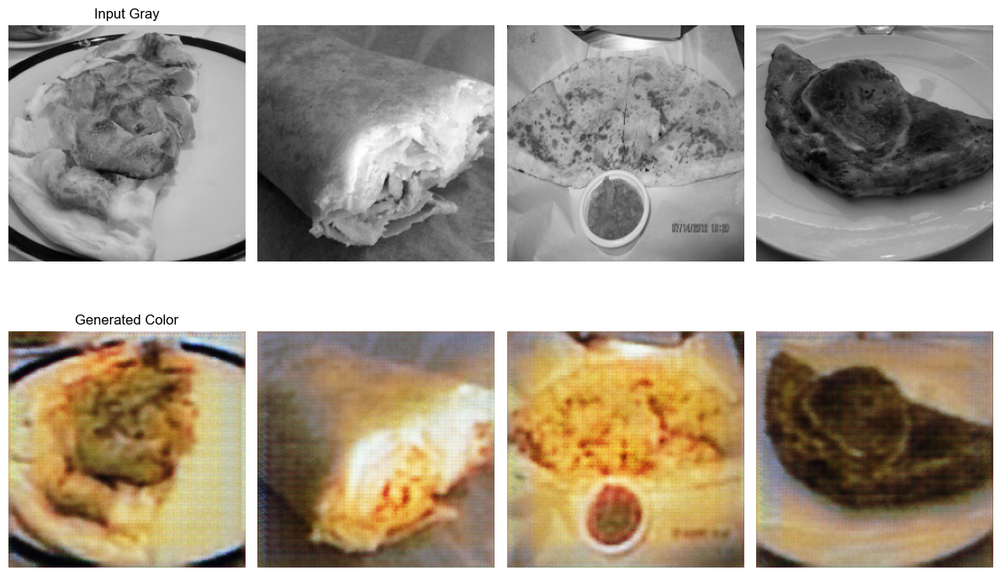

✅ Training completed!


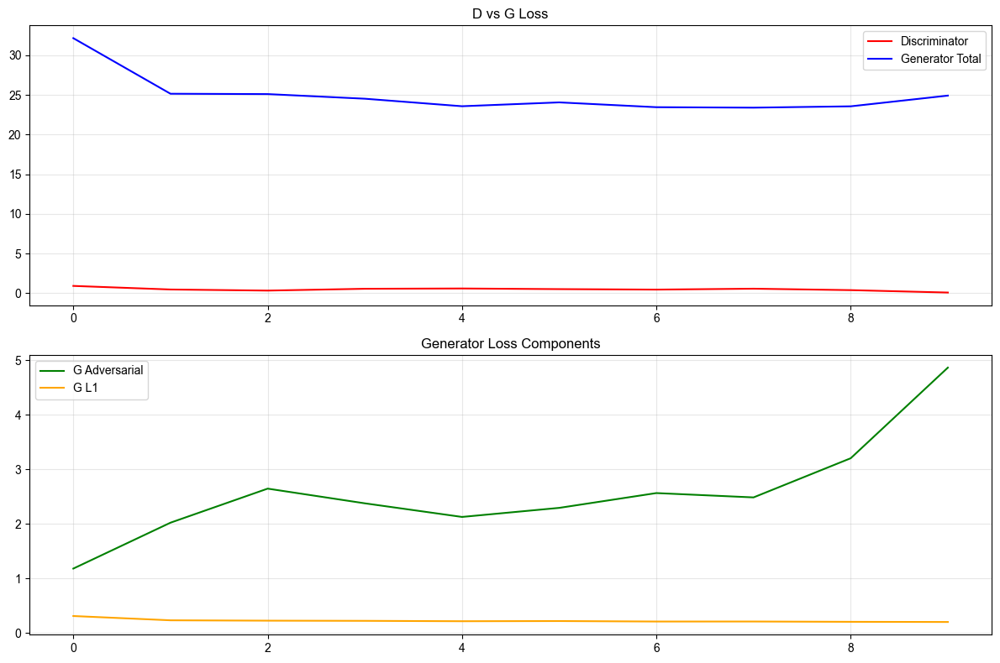

✅ Model saved!
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


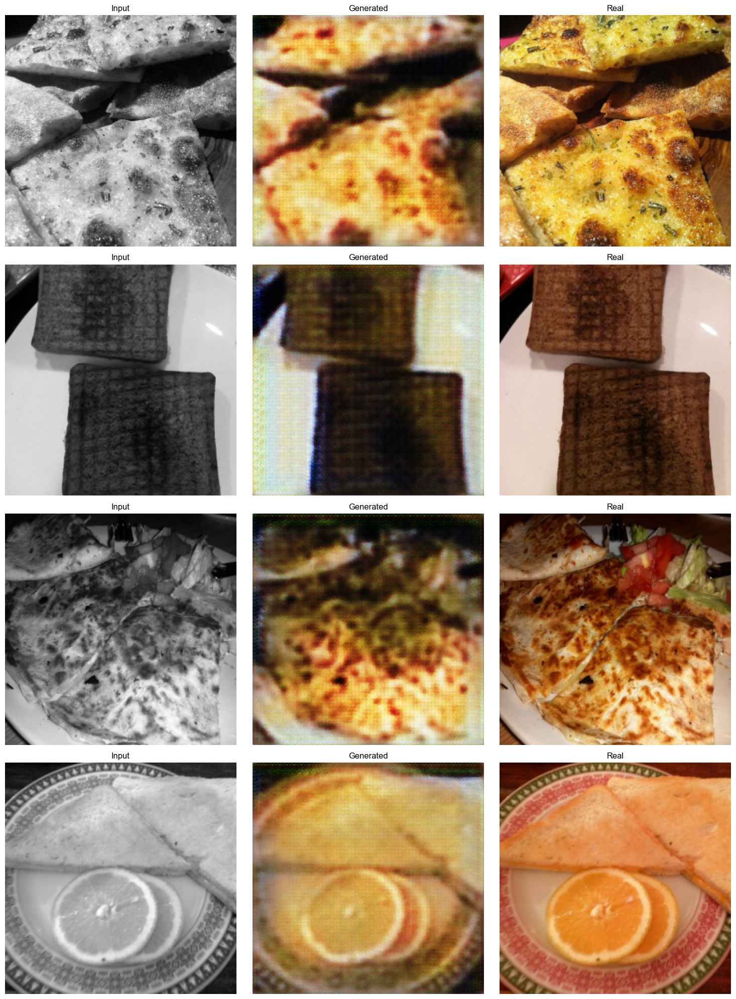

🎉 همه چیز آماده است! حالا می‌تونی با تابع colorize_image تصاویر رو رنگ کنی.


In [7]:
# %% [markdown]
# # 🎨 Image Colorization with GAN - Fast Version (Fixed & Working)
# ## Training with Few Epochs for Quick Testing
# %%

# Install required libraries (if not installed)
# !pip install tensorflow numpy matplotlib opencv-python

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import time
import cv2
from IPython.display import clear_output

# Basic settings
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 10

# TensorFlow settings
tf.keras.mixed_precision.set_global_policy('float32')

# Check GPU
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"✅ GPU detected: {len(gpus)} device(s)")
    except RuntimeError as e:
        print(f"⚠️ GPU configuration error: {e}")
else:
    print("ℹ️ No GPU detected, using CPU")

print("=" * 70)
print("🎨 Starting Fixed & Corrected Image Colorization GAN")
print("=" * 70)

# %% [markdown]
# ## Step 1: Load and Prepare Dataset
# %%
def load_and_preprocess_dataset():
    print("📂 Loading dataset...")
    
    try:
        x_color = np.load('./my_gan_dataset/numpy_data/x_color.npy')
        x_gray = np.load('./my_gan_dataset/numpy_data/x_gray.npy')
        print(f"✅ Dataset loaded successfully!")
    except FileNotFoundError as e:
        print(f"❌ Error: {e}")
        print("Please ensure files exist in './my_gan_dataset/numpy_data/'")
        return None, None

    print(f"📊 Initial shapes → Color: {x_color.shape}, Gray: {x_gray.shape}")

    # Normalize to [-1, 1]
    if x_color.max() > 1.0:
        x_color = (x_color / 127.5) - 1.0
    if x_gray.max() > 1.0:
        x_gray = (x_gray / 127.5) - 1.0

    # Fix grayscale channels
    if x_gray.shape[-1] == 3:
        print("⚠️ Converting 3-channel grayscale to 1-channel...")
        x_gray = np.dot(x_gray[..., :3], [0.2989, 0.5870, 0.1140])
        x_gray = np.expand_dims(x_gray, axis=-1)
    elif x_gray.shape[-1] != 1:
        x_gray = x_gray[..., :1]

    # Match lengths
    if len(x_gray) != len(x_color):
        min_len = min(len(x_gray), len(x_color))
        x_gray = x_gray[:min_len]
        x_color = x_color[:min_len]
        print(f"📏 Adjusted to {min_len} samples")

    print(f"📊 Final shapes → Gray: {x_gray.shape}, Color: {x_color.shape}")
    return x_gray, x_color

# Load data
x_gray, x_color = load_and_preprocess_dataset()
if x_gray is None:
    raise SystemExit("Dataset loading failed!")

# %% [markdown]
# ## Display Some Samples
# %%
num_samples = min(4, len(x_gray))
fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5*num_samples))
if num_samples == 1:
    axes = axes.reshape(1, -1)

for i in range(num_samples):
    axes[i, 0].imshow((x_gray[i].squeeze() + 1)/2, cmap='gray')
    axes[i, 0].set_title(f"Grayscale {i+1}")
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow((x_color[i] + 1)/2)
    axes[i, 1].set_title(f"Real Color {i+1}")
    axes[i, 1].axis('off')
    
    # Color histogram
    for c, color in enumerate(['R', 'G', 'B']):
        hist = x_color[i, :, :, c].flatten()
        axes[i, 2].hist(hist, bins=30, alpha=0.6, color=color.lower(), label=color if i==0 else "")
    axes[i, 2].set_title("Color Distribution")
    if i == 0: axes[i, 2].legend()

plt.tight_layout()
plt.savefig('dataset_samples.png', dpi=150)
plt.show()

# %% [markdown]
# ## Step 2: FIXED Generator (Now outputs 256x256x3 correctly)
# %%
def build_fixed_generator(input_shape=(256, 256, 1)):
    inputs = tf.keras.layers.Input(shape=input_shape)
    
    # Encoder
    e1 = tf.keras.layers.Conv2D(32, 4, strides=2, padding='same')(inputs)   # 128
    e1 = tf.keras.layers.LeakyReLU(0.2)(e1)
    e1 = tf.keras.layers.BatchNormalization()(e1)
    
    e2 = tf.keras.layers.Conv2D(64, 4, strides=2, padding='same')(e1)       # 64
    e2 = tf.keras.layers.LeakyReLU(0.2)(e2)
    e2 = tf.keras.layers.BatchNormalization()(e2)
    
    e3 = tf.keras.layers.Conv2D(128, 4, strides=2, padding='same')(e2)      # 32
    e3 = tf.keras.layers.LeakyReLU(0.2)(e3)
    e3 = tf.keras.layers.BatchNormalization()(e3)
    
    bottleneck = tf.keras.layers.Conv2D(256, 4, strides=2, padding='same')(e3)  # 16
    bottleneck = tf.keras.layers.LeakyReLU(0.2)(bottleneck)
    bottleneck = tf.keras.layers.BatchNormalization()(bottleneck)
    
    # Decoder - حالا ۴ بار upsample می‌کنیم تا به 256 برگردیم
    d1 = tf.keras.layers.Conv2DTranspose(128, 4, strides=2, padding='same')(bottleneck)  # 32
    d1 = tf.keras.layers.ReLU()(d1)
    d1 = tf.keras.layers.BatchNormalization()(d1)
    
    d2 = tf.keras.layers.Conv2DTranspose(64, 4, strides=2, padding='same')(d1)           # 64
    d2 = tf.keras.layers.ReLU()(d2)
    d2 = tf.keras.layers.BatchNormalization()(d2)
    
    d3 = tf.keras.layers.Conv2DTranspose(32, 4, strides=2, padding='same')(d2)           # 128
    d3 = tf.keras.layers.ReLU()(d3)
    d3 = tf.keras.layers.BatchNormalization()(d3)
    
    d4 = tf.keras.layers.Conv2DTranspose(16, 4, strides=2, padding='same')(d3)           # 256
    d4 = tf.keras.layers.ReLU()(d4)
    d4 = tf.keras.layers.BatchNormalization()(d4)
    
    output = tf.keras.layers.Conv2D(3, 3, padding='same', activation='tanh')(d4)         # 256x256x3
    
    model = tf.keras.Model(inputs, output, name="Fixed_Generator")
    print(f"✅ Generator built → Output shape: {model.output_shape}")
    return model

def build_fixed_discriminator():
    input_gray = tf.keras.layers.Input(shape=(256, 256, 1), name='gray')
    input_color = tf.keras.layers.Input(shape=(256, 256, 3), name='color')
    
    combined = tf.keras.layers.Concatenate()([input_gray, input_color])  # (256,256,4)
    
    x = tf.keras.layers.Conv2D(32, 4, strides=2, padding='same')(combined)
    x = tf.keras.layers.LeakyReLU(0.2)(x)
    
    x = tf.keras.layers.Conv2D(64, 4, strides=2, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(0.2)(x)
    
    x = tf.keras.layers.Conv2D(128, 4, strides=2, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(0.2)(x)
    
    x = tf.keras.layers.Conv2D(256, 4, strides=2, padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.LeakyReLU(0.2)(x)
    
    output = tf.keras.layers.Conv2D(1, 4, padding='same')(x)  # PatchGAN output
    
    model = tf.keras.Model([input_gray, input_color], output, name="Fixed_Discriminator")
    return model

# Build models
generator = build_fixed_generator((256, 256, 1))
discriminator = build_fixed_discriminator()

# Quick test
test_out = generator.predict(x_gray[:1], verbose=0)
print(f"🧪 Generator test output shape: {test_out.shape}")  # باید (1, 256, 256, 3) باشد

# %% [markdown]
# ## Step 3: Loss Functions & Trainer
# %%
class SimpleLosses:
    def __init__(self):
        self.bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    
    def discriminator_loss(self, real, fake):
        real_loss = self.bce(tf.ones_like(real), real)
        fake_loss = self.bce(tf.zeros_like(fake), fake)
        return real_loss + fake_loss
    
    def generator_loss(self, fake, generated, target):
        adv_loss = self.bce(tf.ones_like(fake), fake)
        l1_loss = tf.reduce_mean(tf.abs(target - generated))
        total = adv_loss + 100 * l1_loss
        return total, adv_loss, l1_loss

class FixedGANTrainer:
    def __init__(self, gen, disc):
        self.generator = gen
        self.discriminator = disc
        self.gen_opt = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
        self.disc_opt = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
        self.losses = SimpleLosses()
        self.history = {'d_loss': [], 'g_total': [], 'g_adv': [], 'g_l1': []}
    
    @tf.function
    def train_step(self, gray, color):
        with tf.GradientTape() as g_tape, tf.GradientTape() as d_tape:
            fake_color = self.generator(gray, training=True)
            
            real_out = self.discriminator([gray, color], training=True)
            fake_out = self.discriminator([gray, fake_color], training=True)
            
            d_loss = self.losses.discriminator_loss(real_out, fake_out)
            g_total, g_adv, g_l1 = self.losses.generator_loss(fake_out, fake_color, color)
        
        g_grads = g_tape.gradient(g_total, self.generator.trainable_variables)
        d_grads = d_tape.gradient(d_loss, self.discriminator.trainable_variables)
        
        self.gen_opt.apply_gradients(zip(g_grads, self.generator.trainable_variables))
        self.disc_opt.apply_gradients(zip(d_grads, self.discriminator.trainable_variables))
        
        return d_loss, g_total, g_adv, g_l1
    
    def train(self, gray_data, color_data, epochs=10, batch_size=4):
        dataset = tf.data.Dataset.from_tensor_slices((gray_data, color_data))
        dataset = dataset.shuffle(500).batch(batch_size).prefetch(tf.data.AUTOTUNE)
        
        for epoch in range(epochs):
            start = time.time()
            d_loss_total = g_total_total = g_adv_total = g_l1_total = 0
            batches = 0
            
            for gray_b, color_b in dataset:
                d_l, g_t, g_a, g_l1 = self.train_step(gray_b, color_b)
                d_loss_total += d_l
                g_total_total += g_t
                g_adv_total += g_a
                g_l1_total += g_l1
                batches += 1
            
            # Average losses
            d_loss_avg = d_loss_total / batches
            g_total_avg = g_total_total / batches
            g_adv_avg = g_adv_total / batches
            g_l1_avg = g_l1_total / batches
            
            self.history['d_loss'].append(float(d_loss_avg))
            self.history['g_total'].append(float(g_total_avg))
            self.history['g_adv'].append(float(g_adv_avg))
            self.history['g_l1'].append(float(g_l1_avg))
            
            clear_output(wait=True)
            print(f"Epoch {epoch+1}/{epochs} | Time: {time.time()-start:.1f}s")
            print(f"D Loss: {d_loss_avg:.4f} | G Total: {g_total_avg:.4f} (Adv: {g_adv_avg:.4f}, L1: {g_l1_avg:.4f})")
            
            if (epoch+1) % 2 == 0 or epoch == epochs-1:
                self.show_samples(gray_data[:4])
        
        print("✅ Training completed!")
        return self.history
    
    def show_samples(self, gray_samples):
        preds = self.generator.predict(gray_samples, verbose=0)
        plt.figure(figsize=(12, 4*len(gray_samples)//2))
        for i in range(len(gray_samples)):
            plt.subplot(len(gray_samples)//2, 4, i+1)
            if i == 0: plt.title("Input Gray")
            plt.imshow((gray_samples[i].squeeze() + 1)/2, cmap='gray')
            plt.axis('off')
            
            plt.subplot(len(gray_samples)//2, 4, i+1 + len(gray_samples))
            if i == 0: plt.title("Generated Color")
            plt.imshow((preds[i] + 1)/2)
            plt.axis('off')
        plt.tight_layout()
        plt.show()

# %% [markdown]
# ## Step 4: Train the Fixed Model
# %%
FAST_EPOCHS = 10
FAST_BATCH_SIZE = 4

trainer = FixedGANTrainer(generator, discriminator)
history = trainer.train(x_gray, x_color, epochs=FAST_EPOCHS, batch_size=FAST_BATCH_SIZE)

# %% [markdown]
# ## Step 5: Training History Plot
# %%
plt.figure(figsize=(12,8))
plt.subplot(2,1,1)
plt.plot(history['d_loss'], label='Discriminator', color='red')
plt.plot(history['g_total'], label='Generator Total', color='blue')
plt.legend(); plt.grid(alpha=0.3); plt.title('D vs G Loss')

plt.subplot(2,1,2)
plt.plot(history['g_adv'], label='G Adversarial', color='green')
plt.plot(history['g_l1'], label='G L1', color='orange')
plt.legend(); plt.grid(alpha=0.3); plt.title('Generator Loss Components')
plt.tight_layout()
plt.savefig('training_history_fixed.png', dpi=150)
plt.show()

# %% [markdown]
# ## Step 6: Save Model
# %%
generator.save('fixed_colorization_generator.h5')
generator.save_weights('fixed_generator_weights.weights.h5')
print("✅ Model saved!")

# %% [markdown]
# ## Step 7: Final Test
# %%
test_idx = np.random.choice(len(x_gray), 4, replace=False)
test_gray = x_gray[test_idx]
preds = generator.predict(test_gray)

fig, axes = plt.subplots(4, 3, figsize=(15, 20))
for i in range(4):
    axes[i,0].imshow((test_gray[i].squeeze() + 1)/2, cmap='gray')
    axes[i,0].set_title("Input")
    axes[i,0].axis('off')
    
    axes[i,1].imshow((preds[i] + 1)/2)
    axes[i,1].set_title("Generated")
    axes[i,1].axis('off')
    
    axes[i,2].imshow((x_color[test_idx[i]] + 1)/2)
    axes[i,2].set_title("Real")
    axes[i,2].axis('off')

plt.tight_layout()
plt.savefig('final_results.png', dpi=150)
plt.show()

# %% [markdown]
# ## Step 8: Simple Usage Function (Bonus)
# %%
def colorize_image(image_path, model_path='fixed_colorization_generator.h5', output_path='colorized.jpg', enhance=True):
    model = tf.keras.models.load_model(model_path)
    
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError("Image not found")
    
    img = cv2.resize(img, (256, 256))
    img = (img.astype(np.float32) / 127.5) - 1.0
    img = np.expand_dims(img, axis=(0, -1))
    
    pred = model.predict(img, verbose=0)[0]
    pred = ((pred + 1) * 127.5).astype(np.uint8)
    
    if enhance:
        hsv = cv2.cvtColor(pred, cv2.COLOR_RGB2HSV)
        hsv[:,:,1] = np.clip(hsv[:,:,1] * 1.5, 0, 255)
        hsv[:,:,2] = np.clip(hsv[:,:,2] * 1.1, 0, 255)
        pred = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
    
    cv2.imwrite(output_path, cv2.cvtColor(pred, cv2.COLOR_RGB2BGR))
    print(f"✅ Saved to {output_path}")

print("🎉 همه چیز آماده است! حالا می‌تونی با تابع colorize_image تصاویر رو رنگ کنی.")